# Excercises

UW Geospatial Data Analysis  
CEE498/CEWA599  
David Shean  

## Objectives
* Explore spatial and temporal relationships of time series data, collected by networks of in-situ stations
* Learn about dynamic API queries, data ingestion into Pandas/GeoPandas
* Working with Pandas Timestamp and Python DateTime objects
* Explore spatial correlation of time series records
* Explore some simple interpolation routines to create continuous gridded values from sparse points
* Explore some fundamental concepts and metrics for snow science
* Visualize recent snow accumulation in your region

## Discussion
* (t,x,y,z) records for one or more variables
* Pandas Timestamp vs. Python DateTime vs. Numpy.DateTime64
    * https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.Timestamp.html
    * groupby/agg
* Dealing with missing values in DataFrame
    * Sometimes sensors fail or datalogger fails, sometimes values are flagged as erroneous
    * Pandas has excellent support for missing values: https://pandas.pydata.org/pandas-docs/stable/user_guide/missing_data.html
    * `dropna()` https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.dropna.html#pandas.DataFrame.dropna
* Trajectories
    * Argo floats (https://argo.ucsd.edu/)
    * Weather balloons
    * GNSS tracks - vehicles, pedestrians, aircraft
        * Spatial and temporal derivatives
* Permanent stations
    * Stream gage
    * SNOTEL sites
* How big is too big for Pandas/GeoPandas?
    * https://github.com/toddwschneider/nyc-taxi-data
    * PostgreSQL/PostGIS
        * SQL - Structured Query Language, used for managing data in a relational database
* xarray multiple variables for each station on each day, not just snow depth
* Two separate dataframes
    * One storing locations of all sites
    * One storing time series of some variable for all sites
    * Common station ID as key

## Read a bit about SNOTEL data for the Western U.S.

https://www.wcc.nrcs.usda.gov/snow/

This is actually a nice web interface, with some advanced querying and interactive visualization.  You can also download formatted ASCII files (csv) for analysis.  This is great for one-time projects, but it's nice to have [deterministic code](https://en.wikipedia.org/wiki/Deterministic_system) that can be updated as new data appear, without manual steps.  That's what we're going to do here.

### About SNOTEL sites and data:
* https://www.wcc.nrcs.usda.gov/about/mon_automate.html
* https://www.wcc.nrcs.usda.gov/snotel/snotel_sensors.html
* https://directives.sc.egov.usda.gov/OpenNonWebContent.aspx?content=27630.wba

### Sample plots for SNOTEL site at Paradise, WA (south side of Mt. Rainier)
* https://www.nwrfc.noaa.gov/snow/snowplot.cgi?AFSW1
* We will reproduce some of these plots/metrics during this lab, but do so for the entire SNOTEL network

### Interactive dashboard
* https://climate.washington.edu/climate-data/snowdepth/

# CUAHSI WOF server and automated Python data queries

We are going to use a server set up by CUAHSI to serve the SNOTEL data, using a standardized database storage format and query structure.  You don't need to worry about this, but please quickly review the following:
* http://hiscentral.cuahsi.org/pub_network.aspx?n=241 
* http://his.cuahsi.org/wofws.html

### Acronym soup
* SNOTEL = Snow Telemetry
* CUAHSI = Consortium of Universities for the Advancement of Hydrologic Science, Inc
* WOF = WaterOneFlow
* WSDL = Web Services Description Language
* USDA = United States Department of Agriculture
* NRCS = National Resources Conservation Service
* AWDB = Air-Water Database

### Python options

There are a few packages out there that offer convenience functions to query the online SNOTEL databases and unpack the results.  
* climata (https://pypi.org/project/climata/) - last commit Sept 2017 (not a good sign)
* ulmo (https://github.com/ulmo-dev/ulmo) - last commit Oct 2020 (will be superseded by a package called Quest, but still maintained by [Emilio Mayorga](https://apl.uw.edu/people/profile.php?last_name=Mayorga&first_name=Emilio) over at UW APL)

You can also write your own queries using the Python `requests` module and some built-in XML parsing libraries.

Hopefully not overwhelming amount of information - let's just go with ulmo for now.  I've done most of the work to prepare functions for querying and processing the data.  Once you wrap your head around all of the acronyms, it's pretty simple, basically running a few functions here: https://ulmo.readthedocs.io/en/latest/api.html#module-ulmo.cuahsi.wof

We will use ulmo with daily data for this exercise, but please feel free to experiment with hourly data, other variables or other approaches to fetch SNOTEL data.

### Important ulmo installation note

We're going to use the latest development version of ulmo, straight from the github source!  This is a good exercise, and will show you how to install a package directly from source code on github.

In [45]:
#Install directly from github repo main branch
%pip install git+https://github.com/ulmo-dev/ulmo.git

  Cloning https://github.com/ulmo-dev/ulmo.git to /tmp/pip-req-build-6m1aaxxf
Note: you may need to restart the kernel to use updated packages.


In [46]:
import ulmo

# Interactive Demo

## Import necessary modules

In [47]:
import os
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import folium
import contextily as ctx
import scipy.stats

## Load state polygons for later use

In [48]:
states_url = 'http://eric.clst.org/assets/wiki/uploads/Stuff/gz_2010_us_040_00_5m.json'
#states_url = 'http://eric.clst.org/assets/wiki/uploads/Stuff/gz_2010_us_040_00_500k.json'
states_gdf = gpd.read_file(states_url)

## CUAHSI WOF server information
* Try typing this in a browser, note what you get back

In [49]:
#http://his.cuahsi.org/wofws.html
wsdlurl = 'http://hydroportal.cuahsi.org/Snotel/cuahsi_1_1.asmx?WSDL'
#wsdlurl = "http://worldwater.byu.edu/interactive/snotel/services/index.php/cuahsi_1_1.asmx?WSDL"  # WOF 1.1

# Part 1: Query and analyze SNOTEL site spatial information
* Use the ulmo cuahsi interface and the `get_sites` function to fetch data from server

In [50]:
sites = ulmo.cuahsi.wof.get_sites(wsdlurl)

If you get an error (`AttributeError: module 'ulmo' has no attribute 'cuahsi'`), you need to restart your kernel and "Run All Above Selected Cell"

In [51]:
#Preview first item in dictionary
next(iter(sites.items()))

('SNOTEL:301_CA_SNTL',
 {'code': '301_CA_SNTL',
  'name': 'Adin Mtn',
  'network': 'SNOTEL',
  'location': {'latitude': '41.2358283996582',
   'longitude': '-120.79192352294922'},
  'elevation_m': '1886.7120361328125',
  'site_property': {'county': 'Modoc',
   'state': 'California',
   'site_comments': 'beginDate=10/1/1983 12:00:00 AM|endDate=1/1/2100 12:00:00 AM|HUC=180200021403|HUD=18020002|TimeZone=-8.0|actonId=20H13S|shefId=ADMC1|stationTriplet=301:CA:SNTL|isActive=True',
   'pos_accuracy_m': '0'}})

## Take a moment to inspect the output

* What is the `type`?
* Note data structure and different key/value pairs for each site 

## Store as a Pandas DataFrame called `sites_df`
* See the `from_dict` function
* Use `orient` option so the sites comprise the DataFrame index, with columns for 'name', 'elevation_m', etc
* Use the `dropna` method to remove any empty records

In [52]:
sites_df = pd.DataFrame.from_dict(sites, orient='index').dropna()
sites_df.head()

,code,name,network,location,elevation_m,site_property
SNOTEL:301_CA_SNTL,301_CA_SNTL,Adin Mtn,SNOTEL,"{'latitude': '41.2358283996582', 'longitude': ...",1886.7120361328125,"{'county': 'Modoc', 'state': 'California', 'si..."
SNOTEL:907_UT_SNTL,907_UT_SNTL,Agua Canyon,SNOTEL,"{'latitude': '37.522171020507813', 'longitude'...",2712.719970703125,"{'county': 'Kane', 'state': 'Utah', 'site_comm..."
SNOTEL:916_MT_SNTL,916_MT_SNTL,Albro Lake,SNOTEL,"{'latitude': '45.59722900390625', 'longitude':...",2529.840087890625,"{'county': 'Madison', 'state': 'Montana', 'sit..."
SNOTEL:1267_AK_SNTL,1267_AK_SNTL,Alexander Lake,SNOTEL,"{'latitude': '61.749668121337891', 'longitude'...",48.768001556396484,"{'county': 'Matanuska-Susitna', 'state': 'Alas..."
SNOTEL:908_WA_SNTL,908_WA_SNTL,Alpine Meadows,SNOTEL,"{'latitude': '47.779571533203125', 'longitude'...",1066.800048828125,"{'county': 'King', 'state': 'Washington', 'sit..."


## Clean up the DataFrame and prepare Point geometry objects
* We covered this with the GLAS data conversion to GeoPandas
* Convert `'location'` column (contains dictionary with `'latitude'` and `'longitude'` values) to Shapely `Point` objects
* Store as a new `'geometry'` column
* Drop the `'location'` column, as this is no longer needed
* Update the `dtype` of the `'elevation_m'` column to float

In [53]:
sites_df['geometry'] = [Point(float(loc['longitude']), float(loc['latitude'])) for loc in sites_df['location']]

In [54]:
sites_df = sites_df.drop(columns='location')
sites_df = sites_df.astype({"elevation_m":float})

## Review output
* Take a moment to familiarize yourself with the DataFrame structure and different columns.
* Note that the index is a set of strings with format 'SNOTEL:1000_OR_SNTL'
* Extract the first record with `loc`
    * Review the `'site_property'` dictionary - could parse this and store as separate fields in the DataFrame if desired

In [55]:
sites_df.head()

,code,name,network,elevation_m,site_property,geometry
SNOTEL:301_CA_SNTL,301_CA_SNTL,Adin Mtn,SNOTEL,1886.712036,"{'county': 'Modoc', 'state': 'California', 'si...",POINT (-120.7919235229492 41.2358283996582)
SNOTEL:907_UT_SNTL,907_UT_SNTL,Agua Canyon,SNOTEL,2712.719971,"{'county': 'Kane', 'state': 'Utah', 'site_comm...",POINT (-112.2711791992188 37.52217102050781)
SNOTEL:916_MT_SNTL,916_MT_SNTL,Albro Lake,SNOTEL,2529.840088,"{'county': 'Madison', 'state': 'Montana', 'sit...",POINT (-111.9590225219727 45.59722900390625)
SNOTEL:1267_AK_SNTL,1267_AK_SNTL,Alexander Lake,SNOTEL,48.768002,"{'county': 'Matanuska-Susitna', 'state': 'Alas...",POINT (-150.8896636962891 61.74966812133789)
SNOTEL:908_WA_SNTL,908_WA_SNTL,Alpine Meadows,SNOTEL,1066.800049,"{'county': 'King', 'state': 'Washington', 'sit...",POINT (-121.6984710693359 47.77957153320312)


In [56]:
sites_df.loc['SNOTEL:301_CA_SNTL']

code                                                   301_CA_SNTL
name                                                      Adin Mtn
network                                                     SNOTEL
elevation_m                                                1886.71
site_property    {'county': 'Modoc', 'state': 'California', 'si...
geometry               POINT (-120.7919235229492 41.2358283996582)
Name: SNOTEL:301_CA_SNTL, dtype: object

In [57]:
sites_df.loc['SNOTEL:301_CA_SNTL']['site_property']

{'county': 'Modoc',
 'state': 'California',
 'site_comments': 'beginDate=10/1/1983 12:00:00 AM|endDate=1/1/2100 12:00:00 AM|HUC=180200021403|HUD=18020002|TimeZone=-8.0|actonId=20H13S|shefId=ADMC1|stationTriplet=301:CA:SNTL|isActive=True',
 'pos_accuracy_m': '0'}

## Convert to a Geopandas GeoDataFrame
* We already have `'geometry'` column, but still need to define the `crs` 
* Note the number of records

In [58]:
sites_gdf_all = gpd.GeoDataFrame(sites_df, crs='EPSG:4326')
sites_gdf_all.shape

(930, 6)

In [59]:
sites_gdf_all.head()

,code,name,network,elevation_m,site_property,geometry
SNOTEL:301_CA_SNTL,301_CA_SNTL,Adin Mtn,SNOTEL,1886.712036,"{'county': 'Modoc', 'state': 'California', 'si...",POINT (-120.79192 41.23583)
SNOTEL:907_UT_SNTL,907_UT_SNTL,Agua Canyon,SNOTEL,2712.719971,"{'county': 'Kane', 'state': 'Utah', 'site_comm...",POINT (-112.27118 37.52217)
SNOTEL:916_MT_SNTL,916_MT_SNTL,Albro Lake,SNOTEL,2529.840088,"{'county': 'Madison', 'state': 'Montana', 'sit...",POINT (-111.95902 45.59723)
SNOTEL:1267_AK_SNTL,1267_AK_SNTL,Alexander Lake,SNOTEL,48.768002,"{'county': 'Matanuska-Susitna', 'state': 'Alas...",POINT (-150.88966 61.74967)
SNOTEL:908_WA_SNTL,908_WA_SNTL,Alpine Meadows,SNOTEL,1066.800049,"{'county': 'King', 'state': 'Washington', 'sit...",POINT (-121.69847 47.77957)


## Create a scatterplot showing elevation values for all sites

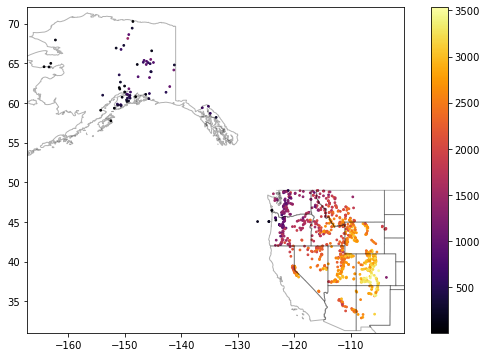

In [60]:
f, ax = plt.subplots(figsize=(10,6))
sites_gdf_all.plot(ax=ax, column='elevation_m', markersize=3, cmap='inferno', legend=True)
ax.autoscale(False)
states_gdf.plot(ax=ax, facecolor='none', edgecolor='k', alpha=0.3);

## Exclude the Alaska (AK) points to isolate points over Western U.S.
* Can remove points where the site name contains 'AK' or can use a spatial filter (see GeoPandas cx indexer functionality)
* Note the number of records

In [61]:
sites_gdf_all = sites_gdf_all[~(sites_gdf_all.index.str.contains('AK'))]
#print(sites_gdf_all.unary_union.centroid)
#xmin, xmax, ymin, ymax = [-126, 102, 30, 50]
#sites_gdf_all = sites_gdf_all.cx[xmin:xmax, ymin:ymax]
sites_gdf_all.shape

(865, 6)

## Update your scatterplot as sanity check
* Should look something like the Western U.S.

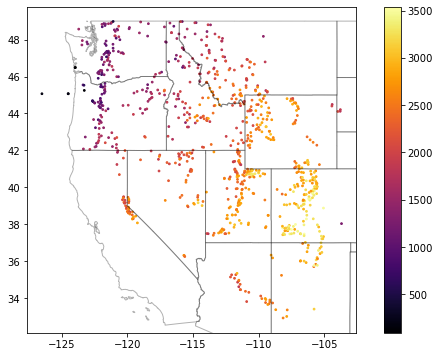

In [62]:
f, ax = plt.subplots(figsize=(10,6))
sites_gdf_all.plot(ax=ax, column='elevation_m', markersize=3, cmap='inferno', legend=True)
ax.autoscale(False)
states_gdf.plot(ax=ax, facecolor='none', edgecolor='k', alpha=0.3);

## Export SNOTEL site GeoDataFrame as a geojson
* Maybe useful for later lab or other analysis

In [63]:
sites_fn = 'snotel_conus_sites.json'
if not os.path.exists(sites_fn):
    sites_gdf_all.to_file(sites_fn, driver='GeoJSON')

## Interactive plot using folium

This was extra credit on the Vector2 lab.  

See the example here: https://python-visualization.github.io/folium/docs-v0.6.0/quickstart.html

For your plot:
* Compute the centroid of the SNOTEL sites (remember GeoPandas `unary_union`)
* Create a folium map object centered on this centroid
    * Use the 'Stamen Terrain' basemap layer
    * Experiment with `zoom_start` level to find a good extent
* Export your GeoDataframe using `to_json()`, then load all features using `folium.features.GeoJson`
* Add the points to the map

Take a moment to explore this interactive map interface.

In [64]:
c = sites_gdf_all.unary_union.centroid
lat = c.y
lon = c.x

### Create a folium map with clustering

* Create an interactive `folium` map with a MarkerCluster that displays the SNOTEL site name and/or ID
* This example is likely useful: https://ocefpaf.github.io/python4oceanographers/blog/2015/12/14/geopandas_folium/

In [65]:
import folium
from folium.plugins import MarkerCluster
m = folium.Map(location=[lat, lon], tiles='Stamen Terrain', zoom_start=5)
#Create clustered map with popups
locations, popups = [], []
for idx,row in sites_gdf_all.iterrows():
    locations.append([row['geometry'].y, row['geometry'].x])
    popups.append(idx)
t = folium.FeatureGroup(name='SNOTEL')
t.add_child(MarkerCluster(locations=locations, popups=popups))
m.add_child(t)

## Create a histogram of SNOTEL site elevations
* What is the highest SNOTEL site in the Western U.S.?
* Thought question: *Do these elevations seem to provide a good sample of elevations where we expect snow to accumulate?*

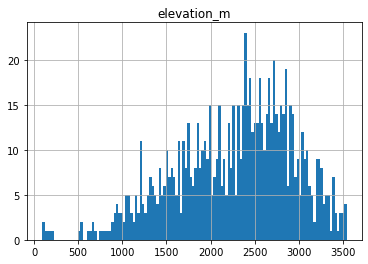

In [66]:
sites_gdf_all.hist('elevation_m', bins=128);

In [67]:
sitecode = sites_gdf_all['elevation_m'].idxmax()

In [68]:
sites_gdf_all.loc[sitecode]

code                                                  1058_CO_SNTL
name                                                      Grayback
network                                                     SNOTEL
elevation_m                                                3541.78
site_property    {'county': 'Rio Grande', 'state': 'Colorado', ...
geometry              POINT (-106.5378265380859 37.47032928466797)
Name: SNOTEL:1058_CO_SNTL, dtype: object

## Reproject the sites GeoDataFrame
* Can use the same Albers Equal Area projection from previous labs, or recompute based on bounds and center of SNOTEL sites

In [69]:
aea_proj = '+proj=aea +lat_1=37.00 +lat_2=47.00 +lat_0=42.00 +lon_0=-114.27'
sites_gdf_all_proj = sites_gdf_all.to_crs(aea_proj)

In [70]:
#Reproject states
states_gdf_proj = states_gdf.to_crs(aea_proj)

In [71]:
#Isolate WA state polygon
wa_state = states_gdf_proj.loc[states_gdf_proj['NAME'] == 'Washington']

## Create a scatterplot and overlay the state polygons

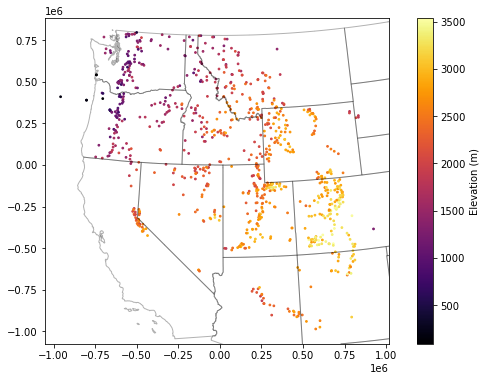

In [72]:
f, ax = plt.subplots(figsize=(10,6))
sites_gdf_all_proj.plot(ax=ax, column='elevation_m', markersize=3, cmap='inferno', legend=True, legend_kwds={'label':'Elevation (m)'})
ax.autoscale(False)
states_gdf_proj.plot(ax=ax, facecolor='none', edgecolor='k', alpha=0.3);

## Isolate WA sites
* As with the GLAS point example, we could do `intersects` or a spatial join with WA polygon
* But probably easiest to filter records with 'WA' in the index
    * Note: need to convert the SNOTEL DataFrame index to `str`
    * `contains` might be a nice option
* Sanity check - note number of records and create a quick scatterplot to verify

In [73]:
wa_idx = sites_gdf_all_proj.index.str.contains('WA')
sites_gdf_wa = sites_gdf_all_proj[wa_idx]
sites_gdf_wa.shape

(84, 6)

In [74]:
#Prepare list of WA stations for use later in lab
#Can preserve as Pandas Index object
wa_stations = sites_gdf_all_proj.index[wa_idx]
#Or convert to list, if desired
#wa_stations = list(sites_gdf_all_proj.index[wa_idx])
wa_stations

Index(['SNOTEL:908_WA_SNTL', 'SNOTEL:990_WA_SNTL', 'SNOTEL:352_WA_SNTL',
       'SNOTEL:1080_WA_SNTL', 'SNOTEL:1107_WA_SNTL', 'SNOTEL:375_WA_SNTL',
       'SNOTEL:376_WA_SNTL', 'SNOTEL:942_WA_SNTL', 'SNOTEL:1109_WA_SNTL',
       'SNOTEL:1085_WA_SNTL', 'SNOTEL:418_WA_SNTL', 'SNOTEL:420_WA_SNTL',
       'SNOTEL:943_WA_SNTL', 'SNOTEL:998_WA_SNTL', 'SNOTEL:910_WA_SNTL',
       'SNOTEL:995_WA_SNTL', 'SNOTEL:994_WA_SNTL', 'SNOTEL:1004_WA_SNTL',
       'SNOTEL:478_WA_SNTL', 'SNOTEL:1159_WA_SNTL', 'SNOTEL:1256_WA_SNTL',
       'SNOTEL:502_WA_SNTL', 'SNOTEL:507_WA_SNTL', 'SNOTEL:515_WA_SNTL',
       'SNOTEL:991_WA_SNTL', 'SNOTEL:928_WA_SNTL', 'SNOTEL:1129_WA_SNTL',
       'SNOTEL:553_WA_SNTL', 'SNOTEL:591_WA_SNTL', 'SNOTEL:599_WA_SNTL',
       'SNOTEL:606_WA_SNTL', 'SNOTEL:1069_WA_SNTL', 'SNOTEL:999_WA_SNTL',
       'SNOTEL:897_WA_SNTL', 'SNOTEL:1011_WA_SNTL', 'SNOTEL:630_WA_SNTL',
       'SNOTEL:262_WA_SNTL', 'SNOTEL:642_WA_SNTL', 'SNOTEL:644_WA_SNTL',
       'SNOTEL:648_WA_SNTL', 'SNOTEL:898_

In [75]:
#Prepare a list of WA stations above a predefined elevation threshold
high_thresh = 1400 #meters
wa_stations_high = sites_gdf_wa.index[sites_gdf_wa['elevation_m'] > high_thresh]
wa_stations_high

Index(['SNOTEL:1080_WA_SNTL', 'SNOTEL:1107_WA_SNTL', 'SNOTEL:375_WA_SNTL',
       'SNOTEL:376_WA_SNTL', 'SNOTEL:1085_WA_SNTL', 'SNOTEL:418_WA_SNTL',
       'SNOTEL:998_WA_SNTL', 'SNOTEL:1004_WA_SNTL', 'SNOTEL:1159_WA_SNTL',
       'SNOTEL:502_WA_SNTL', 'SNOTEL:507_WA_SNTL', 'SNOTEL:515_WA_SNTL',
       'SNOTEL:1129_WA_SNTL', 'SNOTEL:599_WA_SNTL', 'SNOTEL:606_WA_SNTL',
       'SNOTEL:1011_WA_SNTL', 'SNOTEL:630_WA_SNTL', 'SNOTEL:262_WA_SNTL',
       'SNOTEL:642_WA_SNTL', 'SNOTEL:644_WA_SNTL', 'SNOTEL:679_WA_SNTL',
       'SNOTEL:681_WA_SNTL', 'SNOTEL:692_WA_SNTL', 'SNOTEL:707_WA_SNTL',
       'SNOTEL:711_WA_SNTL', 'SNOTEL:1068_WA_SNTL', 'SNOTEL:1043_WA_SNTL',
       'SNOTEL:984_WA_SNTL', 'SNOTEL:264_WA_SNTL', 'SNOTEL:824_WA_SNTL',
       'SNOTEL:832_WA_SNTL', 'SNOTEL:974_WA_SNTL'],
      dtype='object')

## Create scatterplot to verify and add contextily basemap
* Can specify our AEA crs to the `crs` keyword in the ctx `add_basemap` function to reproject on the fly

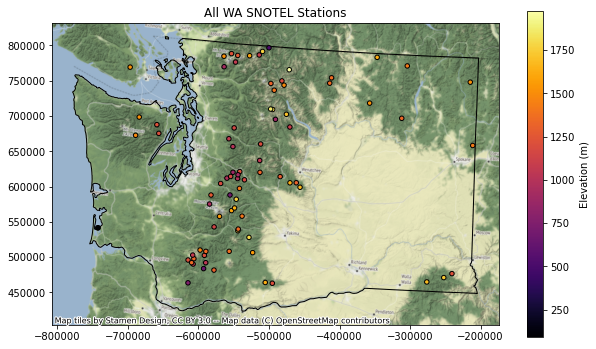

In [76]:
f, ax = plt.subplots(figsize=(10,6))
wa_state.plot(ax=ax, facecolor='none', edgecolor='black')
sites_gdf_wa.plot(ax=ax, column='elevation_m', markersize=20, edgecolor='k', cmap='inferno', \
                  legend=True, legend_kwds={'label':'Elevation (m)'})
ctx.add_basemap(ax=ax, crs=sites_gdf_wa.crs, source=ctx.providers.Stamen.Terrain)
ax.set_title('All WA SNOTEL Stations');

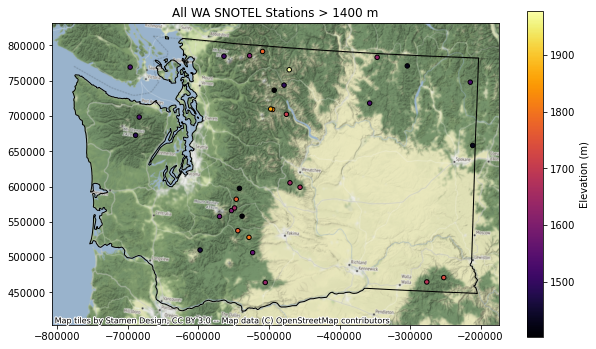

In [77]:
f, ax = plt.subplots(figsize=(10,6))
wa_state.plot(ax=ax, facecolor='none', edgecolor='black')
sites_gdf_wa.loc[wa_stations_high].plot(ax=ax, column='elevation_m', markersize=20, edgecolor='k', \
                                        cmap='inferno', legend=True, legend_kwds={'label':'Elevation (m)'})
ctx.add_basemap(ax=ax, crs=sites_gdf_wa.crs, source=ctx.providers.Stamen.Terrain)
ax.set_title('All WA SNOTEL Stations > %0.0f m' % high_thresh);

## Create a histogram plot showing elevation of all SNOTEL sites in Western US and the WA sample
* These should be two histograms on the same axes
* Discussion question: *What do you notice about the WA sample?*

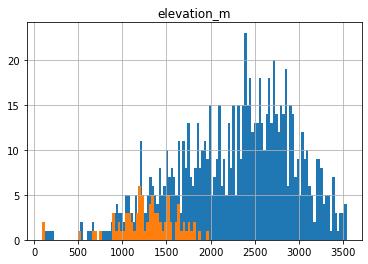

In [78]:
ax = sites_gdf_all.hist('elevation_m', bins=128)
sites_gdf_wa.hist('elevation_m', bins=64, ax=ax);

## Identify the highest site in WA
* Assign the index to a variable named `sitecode`

In [79]:
sitecode_max = sites_gdf_wa['elevation_m'].idxmax()
sitecode = sitecode_max
sites_gdf_wa.loc[sitecode]

code                                                   515_WA_SNTL
name                                                    Harts Pass
network                                                     SNOTEL
elevation_m                                                1978.15
site_property    {'county': 'Okanogan', 'state': 'Washington', ...
geometry              POINT (-471261.4818625616 765568.9706388527)
Name: SNOTEL:515_WA_SNTL, dtype: object

## Query the server for information about this site
* Use the ulmo cuahsi `get_site_info` method here
* Lots of output here, try to skim and get a sense of the different parameters and associated metadata

In [80]:
site_info = ulmo.cuahsi.wof.get_site_info(wsdlurl, sitecode)
#site_info

## Inspect the returned information
* Note number of available variables in the time series data!

In [81]:
dict_keys = site_info['series'].keys()
dict_keys

dict_keys(['SNOTEL:BATT_D', 'SNOTEL:BATT_H', 'SNOTEL:PRCP_y', 'SNOTEL:PRCP_sm', 'SNOTEL:PRCP_m', 'SNOTEL:PRCP_wy', 'SNOTEL:PRCPSA_y', 'SNOTEL:PRCPSA_D', 'SNOTEL:PRCPSA_sm', 'SNOTEL:PRCPSA_m', 'SNOTEL:PRCPSA_wy', 'SNOTEL:PREC_sm', 'SNOTEL:PREC_m', 'SNOTEL:PREC_wy', 'SNOTEL:PVPV_H', 'SNOTEL:RHUMV_H', 'SNOTEL:SNWD_D', 'SNOTEL:SNWD_sm', 'SNOTEL:SNWD_H', 'SNOTEL:SNWD_m', 'SNOTEL:SRAD_D', 'SNOTEL:SRAD_H', 'SNOTEL:SRADN_D', 'SNOTEL:SRADN_sm', 'SNOTEL:SRADN_m', 'SNOTEL:SRADV_D', 'SNOTEL:SRADV_sm', 'SNOTEL:SRADV_H', 'SNOTEL:SRADV_m', 'SNOTEL:SRADX_D', 'SNOTEL:SRADX_sm', 'SNOTEL:SRADX_H', 'SNOTEL:SRADX_m', 'SNOTEL:TAVG_y', 'SNOTEL:TAVG_D', 'SNOTEL:TAVG_sm', 'SNOTEL:TAVG_m', 'SNOTEL:TAVG_wy', 'SNOTEL:TAVG_H', 'SNOTEL:TMAX_y', 'SNOTEL:TMAX_D', 'SNOTEL:TMAX_sm', 'SNOTEL:TMAX_m', 'SNOTEL:TMAX_wy', 'SNOTEL:TMIN_y', 'SNOTEL:TMIN_D', 'SNOTEL:TMIN_sm', 'SNOTEL:TMIN_m', 'SNOTEL:TMIN_wy', 'SNOTEL:TOBS_D', 'SNOTEL:TOBS_sm', 'SNOTEL:TOBS_H', 'SNOTEL:TOBS_m', 'SNOTEL:WDIRV_H', 'SNOTEL:WSPDV_H', 'SNOTEL:WSPDX

In [82]:
len(dict_keys)

60

# Part 2: Time series analysis for one station

## Let's consider the 'SNOTEL:SNWD_D' variable (Daily Snow Depth)
* Assign 'SNOTEL:SNWD_D' to a variable named `variablecode`
* Get some information about the variable using `get_variable_info` method
* Note the units, nodata value, etc.

In [83]:
#Daily SWE
#variablecode = 'SNOTEL:WTEQ_D'
#Daily snow depth
variablecode = 'SNOTEL:SNWD_D'

In [84]:
#Hourly SWE
#variablecode = 'SNOTEL:WTEQ_H'
#Hourly snow depth
#variablecode = 'SNOTEL:SNWD_H'

In [85]:
ulmo.cuahsi.wof.get_variable_info(wsdlurl, variablecode)

{'value_type': 'Field Observation',
 'data_type': 'Continuous',
 'general_category': 'Soil',
 'sample_medium': 'Snow',
 'no_data_value': '-9999',
 'speciation': 'Not Applicable',
 'code': 'SNWD_D',
 'id': '176',
 'name': 'Snow depth',
 'vocabulary': 'SNOTEL',
 'time': {'is_regular': True,
  'interval': '1',
  'units': {'abbreviation': 'd',
   'code': '104',
   'name': 'day',
   'type': 'Time'}},
 'units': {'abbreviation': 'in',
  'code': '49',
  'name': 'international inch',
  'type': 'Length'}}

## Define a function to fetch data
* I've done this for you, but please review the comments and steps to see what is going on under the hood
* You'll probably have to do similar data wrangling for another project at some point in the future

In [86]:
#Get current datetime
today = datetime.today().strftime('%Y-%m-%d')

def fetch(sitecode, variablecode='SNOTEL:SNWD_D', start_date='1950-10-01', end_date=today):
    #print(sitecode, variablecode, start_date, end_date)
    values_df = None
    try:
        #Request data from the server
        site_values = ulmo.cuahsi.wof.get_values(wsdlurl, sitecode, variablecode, start=start_date, end=end_date)
        #Convert to a Pandas DataFrame   
        values_df = pd.DataFrame.from_dict(site_values['values'])
        #Parse the datetime values to Pandas Timestamp objects
        values_df['datetime'] = pd.to_datetime(values_df['datetime'], utc=True)
        #Set the DataFrame index to the Timestamps
        values_df = values_df.set_index('datetime')
        #Convert values to float and replace -9999 nodata values with NaN
        values_df['value'] = pd.to_numeric(values_df['value']).replace(-9999, np.nan)
        #Remove any records flagged with lower quality
        values_df = values_df[values_df['quality_control_level_code'] == '1']
    except:
        print("Unable to fetch %s" % variablecode)

    return values_df

## Use this function to get the full 'SNOTEL:SNWD_D' record for one station
* Can use Paradise station (SNOTEL:679_WA_SNTL), the highest station in WA (from above), or go back up to your folium plot with clusters/labels and pick a site of your choosing!
* Inspect the results
* We used a dummy start date of Jan 1, 1950.  What is the actual the first date returned?

In [87]:
#Hart's Pass
#sitecode = 'SNOTEL:515_WA_SNTL'
#Paradise
sitecode = 'SNOTEL:679_WA_SNTL'

In [88]:
start_date = datetime(1950,1,1)
end_date = datetime.today()

print(sitecode)
values_df = fetch(sitecode, variablecode, start_date, end_date)
#values_df = fetch(sitecode, variablecode)
values_df.tail()

SNOTEL:679_WA_SNTL


,value,qualifiers,censor_code,date_time_utc,method_id,method_code,source_code,quality_control_level_code
datetime,,,,,,,,
2021-02-21 00:00:00+00:00,171.0,V,nc,2021-02-21T00:00:00,0,0,1,1
2021-02-22 00:00:00+00:00,171.0,V,nc,2021-02-22T00:00:00,0,0,1,1
2021-02-23 00:00:00+00:00,188.0,E,nc,2021-02-23T00:00:00,0,0,1,1
2021-02-24 00:00:00+00:00,195.0,V,nc,2021-02-24T00:00:00,0,0,1,1
2021-02-25 00:00:00+00:00,193.0,V,nc,2021-02-25T00:00:00,0,0,1,1


In [89]:
#Get number of decimal years between first and last observation
nyears = (values_df.index.max() - values_df.index.min()).days/365.25
nyears

14.524298425735797

## Create a quick plot to view the time series
* Take a moment to inspect the `value` column, which is where the `SNWD_D` values are stored
* Sanity check thought question: *What are the units again?*

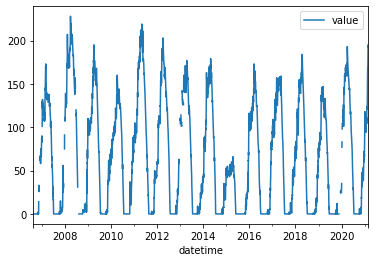

In [90]:
values_df.plot();

## Compute the integer day of year (doy) and integer day of water year (dowy)
* Can get doy for each record with `df.index.dayofyear`
    * Can compute on the fly, but add a new column to store these values
    * https://pandas.pydata.org/pandas-docs/version/0.19/generated/pandas.DatetimeIndex.dayofyear.html
* For the day of water year, you'll need to offset by 9 months, then compute day of year
    * https://en.wikipedia.org/wiki/Water_year
    * Add another column to store these values

In [91]:
#Add DOY and DOWY column
#Need to revisit for leap year support
def add_dowy(df, col=None):
    if col is None:
        df['doy'] = df.index.dayofyear
    else:
        df['doy'] = df[col].dayofyear
    #df['dowy'] = (df['doy'].index - pd.DateOffset(months=9)).dayofyear
    # Sept 30 is doy 273
    df['dowy'] = df['doy'] - 273
    df.loc[df['dowy'] <= 0, 'dowy'] += 365

In [92]:
add_dowy(values_df)

In [93]:
#Define variable to store current year
curr_y = datetime.now().year
curr_y

2021

In [94]:
#Quick sanity check around beginning of WY
values_df[f'{curr_y-1}-09-28':f'{curr_y-1}-10-03']

,value,qualifiers,censor_code,date_time_utc,method_id,method_code,source_code,quality_control_level_code,doy,dowy
datetime,,,,,,,,,,
2020-09-28 00:00:00+00:00,0.0,E,nc,2020-09-28T00:00:00,0,0,1,1,272,364
2020-09-29 00:00:00+00:00,0.0,E,nc,2020-09-29T00:00:00,0,0,1,1,273,365
2020-09-30 00:00:00+00:00,0.0,E,nc,2020-09-30T00:00:00,0,0,1,1,274,1
2020-10-01 00:00:00+00:00,0.0,E,nc,2020-10-01T00:00:00,0,0,1,1,275,2
2020-10-02 00:00:00+00:00,0.0,V,nc,2020-10-02T00:00:00,0,0,1,1,276,3
2020-10-03 00:00:00+00:00,0.0,E,nc,2020-10-03T00:00:00,0,0,1,1,277,4


In [95]:
values_df[f'{curr_y-1}-12-29':f'{curr_y}-01-03']

,value,qualifiers,censor_code,date_time_utc,method_id,method_code,source_code,quality_control_level_code,doy,dowy
datetime,,,,,,,,,,
2020-12-29 00:00:00+00:00,72.0,V,nc,2020-12-29T00:00:00,0,0,1,1,364,91
2020-12-30 00:00:00+00:00,75.0,E,nc,2020-12-30T00:00:00,0,0,1,1,365,92
2020-12-31 00:00:00+00:00,85.0,E,nc,2020-12-31T00:00:00,0,0,1,1,366,93
2021-01-01 00:00:00+00:00,83.0,V,nc,2021-01-01T00:00:00,0,0,1,1,1,93
2021-01-02 00:00:00+00:00,90.0,E,nc,2021-01-02T00:00:00,0,0,1,1,2,94
2021-01-03 00:00:00+00:00,100.0,E,nc,2021-01-03T00:00:00,0,0,1,1,3,95


## Compute statistics for each day of water year, using values from all years
* Seems like a Pandas groupby/agg might work here
* Stats should at least include min, max, mean, and median

In [96]:
stat_list = ['count','min','max','mean','std','median','mad']

In [97]:
doy_stats = values_df.groupby('dowy').agg(stat_list)['value']
doy_stats

,count,min,max,mean,std,median,mad
dowy,,,,,,,
1,15,0.0,9.0,0.666667,2.319688,0.0,1.155556
2,15,0.0,8.0,0.533333,2.065591,0.0,0.995556
3,15,0.0,9.0,0.666667,2.319688,0.0,1.155556
4,15,0.0,5.0,0.600000,1.404076,0.0,0.960000
5,15,0.0,5.0,0.600000,1.454058,0.0,0.960000
...,...,...,...,...,...,...,...
361,15,0.0,1.0,0.066667,0.258199,0.0,0.124444
362,15,0.0,1.0,0.066667,0.258199,0.0,0.124444
363,15,0.0,1.0,0.066667,0.258199,0.0,0.124444


## Create a plot of these aggregated dowy values
* Your output independent variable (x-axis) should be day of water year (1-366), and dependent variable (y-axis) should be median value for that day of year, computed using values from all available years
    * You may have to explicitly specify the x and y valuese for your plot function
* Something like the 30-year mean and median here: https://www.nwrfc.noaa.gov/snow/plot_SWE.php?id=AFSW1
* Extra credit: add shaded regions for standard deviation or normalized median absolute deviation (nmad) for each doy to show spread in values over the full record

## Add the daily snow depth values for the current water year
* Can use pandas indexing here with simple strings ('YYYY-MM-DD'), or Timestamp objects
    * Standard slicing also works with `:`
* Make sure to `dropna` to remove any records missing data
* Add this to your plot

## For most recent snow depth value (today or yesterday), what is the percentage of "normal" snow depth (as defined by long-term median for this dowy) at this site?

# Part 3: Retrieve time series records for **All** SNOTEL Sites
* Now that we've explored one site, let's look at them all!
* Probably some interesting spatial/temporal variability in these metrics

* I've providing the following code to do this for you. Please review so you understand what's going on:
    * Loop through all sites names in the WA GeoDataFrame and run the above `fetch` function
    * Store output in a dictionary
    * Convert the dictionary to a Pandas Dataframe
* Note that this could take some time to run for all SNOTEL sites (~10 min, depending on server load)
    * Progress will be printed out incrementally
    * Several sites may return an error (e.g., `<suds.sax.document.Document object at 0x7f0813040730>`), but this is handled by the `try-except` block in the `fetch` function above
    * While you wait, review the remainder of the lab

## Save the DataFrame, so you don't have to download again
* Can use a number of different formats here, easiest to use a "pickle": https://www.pythoncentral.io/how-to-pickle-unpickle-tutorial/
* Define a unique filename for the dataset (e.g., `pkl_fn='snotel_wa_snwd_d.pkl'`)
* Write the DataFrame to disk
* Read it to a temporary variable and verify that everything looks good

In [98]:
#pkl_fn = variablecode.replace(':','_')+'_'+start_date+'_'+end_date+'.pkl'

In [99]:
#All SNOTEL sites
pkl_fn = 'snotel_snwd_d.pkl'
gdf = sites_gdf_all

#Isolated to WA SNOTEL sites
#pkl_fn = 'snotel_snwd_d_wa.pkl'
#gdf = sites_gdf_wa

In [100]:
if os.path.exists(pkl_fn):
    snwd_df = pd.read_pickle(pkl_fn)
else:
    #Define an empty dictionary to store returns for each site
    value_dict = {}
    for i, sitecode in enumerate(gdf.index):
        print('%i of %i sites' % (i+1, len(gdf.index)) )
        #out = fetch(sitecode, variablecode, start_date, end_date)
        out = fetch(sitecode, variablecode)
        if out is not None:
            value_dict[sitecode] = out['value']
    #Convert the dictionary to a DataFrame, automatically handles different datetime ranges (nice!)
    snwd_df = pd.DataFrame.from_dict(value_dict)
    #Write out
    print(f"Writing out: {pkl_fn}")
    snwd_df.to_pickle(pkl_fn)

1 of 865 sites
2 of 865 sites
3 of 865 sites
4 of 865 sites
5 of 865 sites
6 of 865 sites
7 of 865 sites
8 of 865 sites
9 of 865 sites
10 of 865 sites


Unable to fetch SNOTEL:SNWD_D
11 of 865 sites
12 of 865 sites


Unable to fetch SNOTEL:SNWD_D
13 of 865 sites
14 of 865 sites
15 of 865 sites
16 of 865 sites
17 of 865 sites
18 of 865 sites
19 of 865 sites
20 of 865 sites
21 of 865 sites
22 of 865 sites
23 of 865 sites
24 of 865 sites
25 of 865 sites
26 of 865 sites
27 of 865 sites
28 of 865 sites
29 of 865 sites
30 of 865 sites
31 of 865 sites
32 of 865 sites
33 of 865 sites
34 of 865 sites
35 of 865 sites
36 of 865 sites
37 of 865 sites
38 of 865 sites
39 of 865 sites
40 of 865 sites
41 of 865 sites
42 of 865 sites
43 of 865 sites
44 of 865 sites
45 of 865 sites
46 of 865 sites
47 of 865 sites
48 of 865 sites
49 of 865 sites


Unable to fetch SNOTEL:SNWD_D
50 of 865 sites
51 of 865 sites
52 of 865 sites
53 of 865 sites
54 of 865 sites
55 of 865 sites
56 of 865 sites
57 of 865 sites
58 of 865 sites
59 of 865 sites
60 of 865 sites
61 of 865 sites
62 of 865 sites
63 of 865 sites
64 of 865 sites
65 of 865 sites
66 of 865 sites
67 of 865 sites
68 of 865 sites
69 of 865 sites
70 of 865 sites
71 of 865 sites
72 of 865 sites
73 of 865 sites
74 of 865 sites
75 of 865 sites
76 of 865 sites
77 of 865 sites
78 of 865 sites
79 of 865 sites
80 of 865 sites
81 of 865 sites
82 of 865 sites
83 of 865 sites
84 of 865 sites
85 of 865 sites
86 of 865 sites
87 of 865 sites
88 of 865 sites
89 of 865 sites
90 of 865 sites
91 of 865 sites
92 of 865 sites
93 of 865 sites
94 of 865 sites


Unable to fetch SNOTEL:SNWD_D
95 of 865 sites
96 of 865 sites
97 of 865 sites
98 of 865 sites
99 of 865 sites
100 of 865 sites
101 of 865 sites
102 of 865 sites
103 of 865 sites
104 of 865 sites


Unable to fetch SNOTEL:SNWD_D
105 of 865 sites
106 of 865 sites
107 of 865 sites
108 of 865 sites
109 of 865 sites
110 of 865 sites
111 of 865 sites
112 of 865 sites
113 of 865 sites
114 of 865 sites
115 of 865 sites
116 of 865 sites
117 of 865 sites
118 of 865 sites
119 of 865 sites
120 of 865 sites
121 of 865 sites
122 of 865 sites
123 of 865 sites
124 of 865 sites
125 of 865 sites
126 of 865 sites
127 of 865 sites
128 of 865 sites
129 of 865 sites
130 of 865 sites
131 of 865 sites
132 of 865 sites


Unable to fetch SNOTEL:SNWD_D
133 of 865 sites
134 of 865 sites
135 of 865 sites
136 of 865 sites


Unable to fetch SNOTEL:SNWD_D
137 of 865 sites
138 of 865 sites
139 of 865 sites
140 of 865 sites
141 of 865 sites
142 of 865 sites
143 of 865 sites
144 of 865 sites
145 of 865 sites
146 of 865 sites
147 of 865 sites
148 of 865 sites


Unable to fetch SNOTEL:SNWD_D
149 of 865 sites
150 of 865 sites
151 of 865 sites
152 of 865 sites
153 of 865 sites
154 of 865 sites
155 of 865 sites
156 of 865 sites
157 of 865 sites
158 of 865 sites
159 of 865 sites
160 of 865 sites
161 of 865 sites
162 of 865 sites
163 of 865 sites
164 of 865 sites
165 of 865 sites
166 of 865 sites
167 of 865 sites
168 of 865 sites
169 of 865 sites
170 of 865 sites
171 of 865 sites
172 of 865 sites
173 of 865 sites
174 of 865 sites
175 of 865 sites
176 of 865 sites
177 of 865 sites
178 of 865 sites
179 of 865 sites


Unable to fetch SNOTEL:SNWD_D
180 of 865 sites
181 of 865 sites
182 of 865 sites
183 of 865 sites
184 of 865 sites
185 of 865 sites
186 of 865 sites
187 of 865 sites
188 of 865 sites
189 of 865 sites
190 of 865 sites
191 of 865 sites
192 of 865 sites
193 of 865 sites
194 of 865 sites
195 of 865 sites
196 of 865 sites
197 of 865 sites
198 of 865 sites
199 of 865 sites
200 of 865 sites
201 of 865 sites
202 of 865 sites
203 of 865 sites
204 of 865 sites


Unable to fetch SNOTEL:SNWD_D
205 of 865 sites
206 of 865 sites
207 of 865 sites
208 of 865 sites


Unable to fetch SNOTEL:SNWD_D
209 of 865 sites
210 of 865 sites
211 of 865 sites
212 of 865 sites
213 of 865 sites
214 of 865 sites
215 of 865 sites
216 of 865 sites
217 of 865 sites
218 of 865 sites
219 of 865 sites
220 of 865 sites
221 of 865 sites
222 of 865 sites
223 of 865 sites
224 of 865 sites
225 of 865 sites
226 of 865 sites
227 of 865 sites
228 of 865 sites
229 of 865 sites
230 of 865 sites
231 of 865 sites
232 of 865 sites
233 of 865 sites
234 of 865 sites
235 of 865 sites
236 of 865 sites
237 of 865 sites
238 of 865 sites
239 of 865 sites
240 of 865 sites
241 of 865 sites
242 of 865 sites
243 of 865 sites
244 of 865 sites
245 of 865 sites


Unable to fetch SNOTEL:SNWD_D
246 of 865 sites


Unable to fetch SNOTEL:SNWD_D
247 of 865 sites


Unable to fetch SNOTEL:SNWD_D
248 of 865 sites


Unable to fetch SNOTEL:SNWD_D
249 of 865 sites


Unable to fetch SNOTEL:SNWD_D
250 of 865 sites


Unable to fetch SNOTEL:SNWD_D
251 of 865 sites


Unable to fetch SNOTEL:SNWD_D
252 of 865 sites


Unable to fetch SNOTEL:SNWD_D
253 of 865 sites


Unable to fetch SNOTEL:SNWD_D
254 of 865 sites


Unable to fetch SNOTEL:SNWD_D
255 of 865 sites


Unable to fetch SNOTEL:SNWD_D
256 of 865 sites


Unable to fetch SNOTEL:SNWD_D
257 of 865 sites


Unable to fetch SNOTEL:SNWD_D
258 of 865 sites


Unable to fetch SNOTEL:SNWD_D
259 of 865 sites


Unable to fetch SNOTEL:SNWD_D
260 of 865 sites


Unable to fetch SNOTEL:SNWD_D
261 of 865 sites
262 of 865 sites
263 of 865 sites
264 of 865 sites
265 of 865 sites
266 of 865 sites
267 of 865 sites
268 of 865 sites
269 of 865 sites
270 of 865 sites
271 of 865 sites
272 of 865 sites
273 of 865 sites
274 of 865 sites
275 of 865 sites
276 of 865 sites
277 of 865 sites
278 of 865 sites
279 of 865 sites
280 of 865 sites
281 of 865 sites
282 of 865 sites
283 of 865 sites
284 of 865 sites
285 of 865 sites
286 of 865 sites
287 of 865 sites
288 of 865 sites
289 of 865 sites
290 of 865 sites
291 of 865 sites
292 of 865 sites
293 of 865 sites
294 of 865 sites
295 of 865 sites
296 of 865 sites
297 of 865 sites
298 of 865 sites
299 of 865 sites


Unable to fetch SNOTEL:SNWD_D
300 of 865 sites
301 of 865 sites
302 of 865 sites
303 of 865 sites
304 of 865 sites
305 of 865 sites
306 of 865 sites
307 of 865 sites
308 of 865 sites
309 of 865 sites
310 of 865 sites
311 of 865 sites
312 of 865 sites
313 of 865 sites
314 of 865 sites
315 of 865 sites
316 of 865 sites
317 of 865 sites
318 of 865 sites
319 of 865 sites
320 of 865 sites
321 of 865 sites
322 of 865 sites
323 of 865 sites


Unable to fetch SNOTEL:SNWD_D
324 of 865 sites
325 of 865 sites
326 of 865 sites
327 of 865 sites
328 of 865 sites
329 of 865 sites
330 of 865 sites
331 of 865 sites
332 of 865 sites
333 of 865 sites
334 of 865 sites
335 of 865 sites
336 of 865 sites
337 of 865 sites
338 of 865 sites
339 of 865 sites
340 of 865 sites
341 of 865 sites
342 of 865 sites
343 of 865 sites
344 of 865 sites
345 of 865 sites
346 of 865 sites
347 of 865 sites
348 of 865 sites
349 of 865 sites
350 of 865 sites
351 of 865 sites
352 of 865 sites
353 of 865 sites
354 of 865 sites
355 of 865 sites
356 of 865 sites
357 of 865 sites
358 of 865 sites
359 of 865 sites
360 of 865 sites
361 of 865 sites
362 of 865 sites
363 of 865 sites


Unable to fetch SNOTEL:SNWD_D
364 of 865 sites
365 of 865 sites
366 of 865 sites
367 of 865 sites
368 of 865 sites
369 of 865 sites
370 of 865 sites
371 of 865 sites
372 of 865 sites
373 of 865 sites


Unable to fetch SNOTEL:SNWD_D
374 of 865 sites
375 of 865 sites


Unable to fetch SNOTEL:SNWD_D
376 of 865 sites
377 of 865 sites
378 of 865 sites
379 of 865 sites
380 of 865 sites
381 of 865 sites
382 of 865 sites
383 of 865 sites
384 of 865 sites
385 of 865 sites
386 of 865 sites
387 of 865 sites
388 of 865 sites
389 of 865 sites
390 of 865 sites
391 of 865 sites
392 of 865 sites
393 of 865 sites
394 of 865 sites
395 of 865 sites
396 of 865 sites
397 of 865 sites
398 of 865 sites
399 of 865 sites
400 of 865 sites
401 of 865 sites
402 of 865 sites
403 of 865 sites
404 of 865 sites
405 of 865 sites
406 of 865 sites
407 of 865 sites
408 of 865 sites
409 of 865 sites
410 of 865 sites
411 of 865 sites
412 of 865 sites
413 of 865 sites
414 of 865 sites
415 of 865 sites
416 of 865 sites
417 of 865 sites
418 of 865 sites
419 of 865 sites
420 of 865 sites
421 of 865 sites


Unable to fetch SNOTEL:SNWD_D
422 of 865 sites
423 of 865 sites
424 of 865 sites
425 of 865 sites
426 of 865 sites
427 of 865 sites
428 of 865 sites
429 of 865 sites
430 of 865 sites
431 of 865 sites
432 of 865 sites
433 of 865 sites
434 of 865 sites
435 of 865 sites
436 of 865 sites
437 of 865 sites
438 of 865 sites
439 of 865 sites
440 of 865 sites
441 of 865 sites
442 of 865 sites
443 of 865 sites
444 of 865 sites
445 of 865 sites
446 of 865 sites
447 of 865 sites


Unable to fetch SNOTEL:SNWD_D
448 of 865 sites
449 of 865 sites
450 of 865 sites
451 of 865 sites
452 of 865 sites
453 of 865 sites
454 of 865 sites
455 of 865 sites
456 of 865 sites
457 of 865 sites
458 of 865 sites
459 of 865 sites
460 of 865 sites
461 of 865 sites
462 of 865 sites
463 of 865 sites
464 of 865 sites


Unable to fetch SNOTEL:SNWD_D
465 of 865 sites
466 of 865 sites
467 of 865 sites
468 of 865 sites
469 of 865 sites
470 of 865 sites
471 of 865 sites
472 of 865 sites
473 of 865 sites


Unable to fetch SNOTEL:SNWD_D
474 of 865 sites
475 of 865 sites
476 of 865 sites
477 of 865 sites
478 of 865 sites
479 of 865 sites
480 of 865 sites
481 of 865 sites
482 of 865 sites
483 of 865 sites
484 of 865 sites
485 of 865 sites
486 of 865 sites
487 of 865 sites
488 of 865 sites
489 of 865 sites
490 of 865 sites
491 of 865 sites
492 of 865 sites
493 of 865 sites
494 of 865 sites
495 of 865 sites
496 of 865 sites
497 of 865 sites
498 of 865 sites


Unable to fetch SNOTEL:SNWD_D
499 of 865 sites
500 of 865 sites


Unable to fetch SNOTEL:SNWD_D
501 of 865 sites
502 of 865 sites
503 of 865 sites
504 of 865 sites
505 of 865 sites
506 of 865 sites
507 of 865 sites
508 of 865 sites
509 of 865 sites
510 of 865 sites
511 of 865 sites
512 of 865 sites
513 of 865 sites
514 of 865 sites
515 of 865 sites
516 of 865 sites
517 of 865 sites
518 of 865 sites
519 of 865 sites
520 of 865 sites
521 of 865 sites
522 of 865 sites
523 of 865 sites
524 of 865 sites
525 of 865 sites
526 of 865 sites
527 of 865 sites
528 of 865 sites
529 of 865 sites
530 of 865 sites


Unable to fetch SNOTEL:SNWD_D
531 of 865 sites
532 of 865 sites
533 of 865 sites
534 of 865 sites
535 of 865 sites
536 of 865 sites
537 of 865 sites
538 of 865 sites
539 of 865 sites


Unable to fetch SNOTEL:SNWD_D
540 of 865 sites


Unable to fetch SNOTEL:SNWD_D
541 of 865 sites
542 of 865 sites
543 of 865 sites
544 of 865 sites
545 of 865 sites
546 of 865 sites
547 of 865 sites
548 of 865 sites
549 of 865 sites
550 of 865 sites
551 of 865 sites
552 of 865 sites
553 of 865 sites
554 of 865 sites
555 of 865 sites


Unable to fetch SNOTEL:SNWD_D
556 of 865 sites
557 of 865 sites


Unable to fetch SNOTEL:SNWD_D
558 of 865 sites
559 of 865 sites
560 of 865 sites
561 of 865 sites
562 of 865 sites
563 of 865 sites
564 of 865 sites
565 of 865 sites
566 of 865 sites
567 of 865 sites
568 of 865 sites


Unable to fetch SNOTEL:SNWD_D
569 of 865 sites
570 of 865 sites
571 of 865 sites
572 of 865 sites
573 of 865 sites
574 of 865 sites
575 of 865 sites
576 of 865 sites
577 of 865 sites


Unable to fetch SNOTEL:SNWD_D
578 of 865 sites
579 of 865 sites
580 of 865 sites
581 of 865 sites
582 of 865 sites
583 of 865 sites
584 of 865 sites
585 of 865 sites
586 of 865 sites
587 of 865 sites
588 of 865 sites
589 of 865 sites
590 of 865 sites
591 of 865 sites
592 of 865 sites
593 of 865 sites


Unable to fetch SNOTEL:SNWD_D
594 of 865 sites
595 of 865 sites
596 of 865 sites
597 of 865 sites
598 of 865 sites
599 of 865 sites
600 of 865 sites
601 of 865 sites
602 of 865 sites
603 of 865 sites
604 of 865 sites
605 of 865 sites
606 of 865 sites
607 of 865 sites
608 of 865 sites
609 of 865 sites
610 of 865 sites
611 of 865 sites
612 of 865 sites
613 of 865 sites
614 of 865 sites
615 of 865 sites
616 of 865 sites
617 of 865 sites
618 of 865 sites
619 of 865 sites
620 of 865 sites
621 of 865 sites
622 of 865 sites
623 of 865 sites
624 of 865 sites
625 of 865 sites
626 of 865 sites
627 of 865 sites
628 of 865 sites
629 of 865 sites
630 of 865 sites
631 of 865 sites
632 of 865 sites
633 of 865 sites
634 of 865 sites
635 of 865 sites
636 of 865 sites
637 of 865 sites
638 of 865 sites
639 of 865 sites
640 of 865 sites
641 of 865 sites
642 of 865 sites
643 of 865 sites
644 of 865 sites
645 of 865 sites
646 of 865 sites
647 of 865 sites
648 of 865 sites
649 of 865 sites
650 of 865 sites
6

Unable to fetch SNOTEL:SNWD_D
662 of 865 sites
663 of 865 sites
664 of 865 sites
665 of 865 sites
666 of 865 sites
667 of 865 sites
668 of 865 sites
669 of 865 sites
670 of 865 sites
671 of 865 sites
672 of 865 sites
673 of 865 sites
674 of 865 sites
675 of 865 sites
676 of 865 sites
677 of 865 sites
678 of 865 sites
679 of 865 sites
680 of 865 sites
681 of 865 sites
682 of 865 sites
683 of 865 sites
684 of 865 sites
685 of 865 sites


Unable to fetch SNOTEL:SNWD_D
686 of 865 sites
687 of 865 sites
688 of 865 sites
689 of 865 sites
690 of 865 sites


Unable to fetch SNOTEL:SNWD_D
691 of 865 sites
692 of 865 sites
693 of 865 sites
694 of 865 sites
695 of 865 sites
696 of 865 sites
697 of 865 sites
698 of 865 sites
699 of 865 sites
700 of 865 sites
701 of 865 sites
702 of 865 sites
703 of 865 sites
704 of 865 sites
705 of 865 sites
706 of 865 sites
707 of 865 sites
708 of 865 sites
709 of 865 sites
710 of 865 sites
711 of 865 sites
712 of 865 sites
713 of 865 sites
714 of 865 sites
715 of 865 sites
716 of 865 sites
717 of 865 sites
718 of 865 sites
719 of 865 sites
720 of 865 sites
721 of 865 sites
722 of 865 sites
723 of 865 sites
724 of 865 sites


Unable to fetch SNOTEL:SNWD_D
725 of 865 sites
726 of 865 sites
727 of 865 sites
728 of 865 sites
729 of 865 sites
730 of 865 sites
731 of 865 sites
732 of 865 sites
733 of 865 sites
734 of 865 sites


Unable to fetch SNOTEL:SNWD_D
735 of 865 sites
736 of 865 sites
737 of 865 sites
738 of 865 sites


Unable to fetch SNOTEL:SNWD_D
739 of 865 sites
740 of 865 sites
741 of 865 sites
742 of 865 sites
743 of 865 sites


Unable to fetch SNOTEL:SNWD_D
744 of 865 sites
745 of 865 sites
746 of 865 sites
747 of 865 sites
748 of 865 sites
749 of 865 sites
750 of 865 sites
751 of 865 sites
752 of 865 sites
753 of 865 sites
754 of 865 sites
755 of 865 sites
756 of 865 sites
757 of 865 sites
758 of 865 sites
759 of 865 sites
760 of 865 sites
761 of 865 sites
762 of 865 sites
763 of 865 sites
764 of 865 sites
765 of 865 sites
766 of 865 sites


Unable to fetch SNOTEL:SNWD_D
767 of 865 sites
768 of 865 sites
769 of 865 sites
770 of 865 sites
771 of 865 sites
772 of 865 sites
773 of 865 sites
774 of 865 sites
775 of 865 sites
776 of 865 sites
777 of 865 sites
778 of 865 sites
779 of 865 sites
780 of 865 sites
781 of 865 sites
782 of 865 sites
783 of 865 sites
784 of 865 sites
785 of 865 sites
786 of 865 sites
787 of 865 sites
788 of 865 sites
789 of 865 sites
790 of 865 sites
791 of 865 sites
792 of 865 sites
793 of 865 sites
794 of 865 sites
795 of 865 sites
796 of 865 sites
797 of 865 sites
798 of 865 sites
799 of 865 sites


Unable to fetch SNOTEL:SNWD_D
800 of 865 sites
801 of 865 sites
802 of 865 sites
803 of 865 sites
804 of 865 sites
805 of 865 sites
806 of 865 sites
807 of 865 sites
808 of 865 sites
809 of 865 sites
810 of 865 sites
811 of 865 sites


Unable to fetch SNOTEL:SNWD_D
812 of 865 sites
813 of 865 sites
814 of 865 sites
815 of 865 sites
816 of 865 sites
817 of 865 sites
818 of 865 sites
819 of 865 sites
820 of 865 sites
821 of 865 sites
822 of 865 sites


Unable to fetch SNOTEL:SNWD_D
823 of 865 sites
824 of 865 sites
825 of 865 sites
826 of 865 sites
827 of 865 sites
828 of 865 sites


Unable to fetch SNOTEL:SNWD_D
829 of 865 sites
830 of 865 sites
831 of 865 sites
832 of 865 sites
833 of 865 sites
834 of 865 sites
835 of 865 sites
836 of 865 sites
837 of 865 sites


Unable to fetch SNOTEL:SNWD_D
838 of 865 sites
839 of 865 sites
840 of 865 sites
841 of 865 sites
842 of 865 sites
843 of 865 sites
844 of 865 sites
845 of 865 sites
846 of 865 sites
847 of 865 sites
848 of 865 sites
849 of 865 sites
850 of 865 sites
851 of 865 sites
852 of 865 sites
853 of 865 sites
854 of 865 sites
855 of 865 sites
856 of 865 sites
857 of 865 sites
858 of 865 sites
859 of 865 sites
860 of 865 sites
861 of 865 sites
862 of 865 sites
863 of 865 sites
864 of 865 sites
865 of 865 sites
Writing out: snotel_snwd_d.pkl


## Inspect the DataFrame
* Note structure, number of timestamps, NaNs
* What is the date of the first snow depth measurement in the network?
    * Note that the water equivalent (WTEQ_D) measurements from snow pillows extend much farther back in time, back to the early 1980s, before the ultrasonic snow depth instruments were incorporated across the network.  These are better to use for long-term studies.

In [101]:
snwd_df.shape

(13298, 806)

In [102]:
snwd_df.head()

,SNOTEL:301_CA_SNTL,SNOTEL:907_UT_SNTL,SNOTEL:916_MT_SNTL,SNOTEL:908_WA_SNTL,SNOTEL:302_OR_SNTL,SNOTEL:1000_OR_SNTL,SNOTEL:303_CO_SNTL,SNOTEL:1030_CO_SNTL,SNOTEL:304_OR_SNTL,SNOTEL:306_ID_SNTL,...,SNOTEL:872_WY_SNTL,SNOTEL:873_OR_SNTL,SNOTEL:874_CO_SNTL,SNOTEL:875_WY_SNTL,SNOTEL:876_MT_SNTL,SNOTEL:877_AZ_SNTL,SNOTEL:1228_UT_SNTL,SNOTEL:1197_UT_SNTL,SNOTEL:878_WY_SNTL,SNOTEL:1033_CO_SNTL
datetime,,,,,,,,,,,,,,,,,,,,,
1984-10-01 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1984-10-02 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1984-10-03 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1984-10-04 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1984-10-05 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [66]:
snwd_df.describe()

,SNOTEL:301_CA_SNTL,SNOTEL:907_UT_SNTL,SNOTEL:916_MT_SNTL,SNOTEL:908_WA_SNTL,SNOTEL:302_OR_SNTL,SNOTEL:1000_OR_SNTL,SNOTEL:303_CO_SNTL,SNOTEL:1030_CO_SNTL,SNOTEL:304_OR_SNTL,SNOTEL:306_ID_SNTL,...,SNOTEL:872_WY_SNTL,SNOTEL:873_OR_SNTL,SNOTEL:874_CO_SNTL,SNOTEL:875_WY_SNTL,SNOTEL:876_MT_SNTL,SNOTEL:877_AZ_SNTL,SNOTEL:1228_UT_SNTL,SNOTEL:1197_UT_SNTL,SNOTEL:878_WY_SNTL,SNOTEL:1033_CO_SNTL
count,8237.000000,8173.000000,8924.000000,6103.000000,7407.000000,7458.000000,7385.000000,6402.000000,6468.000000,8795.000000,...,5614.000000,5725.000000,8284.000000,7128.000000,6797.000000,6185.000000,3127.00000,3143.000000,7244.000000,6090.000000
mean,9.743596,7.439741,24.902174,35.332951,27.337519,35.849558,6.377116,29.565917,15.311070,31.079022,...,9.041503,14.762969,34.598262,11.130471,10.437840,3.924010,10.54621,8.742603,18.222667,31.388013
std,14.627869,12.829321,23.552421,42.432964,27.273839,40.686039,9.732130,27.805866,19.932041,34.176451,...,11.332270,19.291954,36.224335,14.395877,12.986167,7.871505,14.16615,12.111207,19.911463,34.733819
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,22.000000,15.000000,21.000000,20.000000,1.000000,24.000000,0.000000,17.000000,...,3.000000,0.000000,26.000000,1.000000,4.000000,0.000000,0.00000,0.000000,10.000000,22.000000
75%,17.000000,12.000000,44.000000,67.000000,49.000000,68.000000,10.000000,54.000000,31.250000,59.000000,...,17.000000,30.000000,62.000000,22.000000,19.000000,3.000000,22.00000,18.000000,34.000000,55.000000
max,66.000000,70.000000,95.000000,175.000000,107.000000,162.000000,68.000000,106.000000,76.000000,174.000000,...,139.000000,75.000000,198.000000,64.000000,61.000000,56.000000,60.00000,55.000000,79.000000,169.000000


## Convert snow depth inches to cm
* Use these values for the remainder of the lab

## Create a histogram of all snow depth values
* Use the Pandas `stack` function here, otherwise you will end up with histograms for each station
* Consider using log scale, as you likely have a spike for days with 0 snow depth

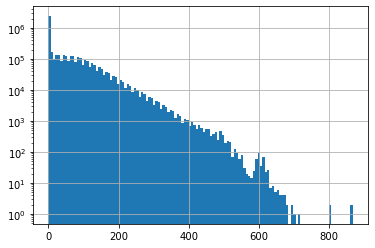

In [69]:
f, ax = plt.subplots()
snwd_df.stack().hist(bins=128, ax=ax, log=True);

## Get the total count of operational stations on each day and plot over time
* Thought question *Can you identify years where a large number of new snow depth sensors were added to the network?*

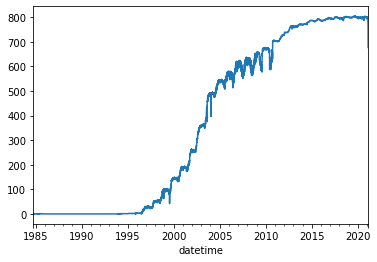

# Part 4: Consider temporal correlation of snow depth for nearby stations 
* Can use Paradise ('SNOTEL:679_WA_SNTL') and nearby station identified on the labeled folium plot above
* Plot the time series from both stations
* Can also use dropna here, but careful about methodology (`any` vs `all`, vs `thresh`)
    * https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.dropna.html

In [73]:
#Highest site
#site1 = 'SNOTEL:863_WA_SNTL'
#site2 = 'SNOTEL:692_WA_SNTL'

In [74]:
#Paradise and nearby sites
site1 = 'SNOTEL:679_WA_SNTL'
site2 = 'SNOTEL:1085_WA_SNTL'
site3 = 'SNOTEL:1257_WA_SNTL'
site4 = 'SNOTEL:941_WA_SNTL'
site5 = 'SNOTEL:642_WA_SNTL'

### Start with two nearby stations

In [75]:
site_list = [site1,site2]
#Use corresponding colors in line and location scatterplots
color_list = ['C%i' % i for i in range(len(site_list))]

In [76]:
snwd_df[site_list]

,SNOTEL:679_WA_SNTL,SNOTEL:1085_WA_SNTL
datetime,,
1984-10-01 00:00:00+00:00,NaN,NaN
1984-10-02 00:00:00+00:00,NaN,NaN
1984-10-03 00:00:00+00:00,NaN,NaN
1984-10-04 00:00:00+00:00,NaN,NaN
1984-10-05 00:00:00+00:00,NaN,NaN
...,...,...
2021-02-13 00:00:00+00:00,360.68,327.66
2021-02-14 00:00:00+00:00,370.84,342.90
2021-02-15 00:00:00+00:00,383.54,363.22


#### Limit to records where both have valid data (drop NaN)

In [77]:
snwd_df[site_list].dropna(thresh=2)

,SNOTEL:679_WA_SNTL,SNOTEL:1085_WA_SNTL
datetime,,
2006-10-05 00:00:00+00:00,0.00,0.00
2006-10-06 00:00:00+00:00,0.00,0.00
2006-10-07 00:00:00+00:00,0.00,0.00
2006-10-08 00:00:00+00:00,0.00,0.00
2006-10-09 00:00:00+00:00,0.00,0.00
...,...,...
2021-02-13 00:00:00+00:00,360.68,327.66
2021-02-14 00:00:00+00:00,370.84,342.90
2021-02-15 00:00:00+00:00,383.54,363.22


### Plot location and time series

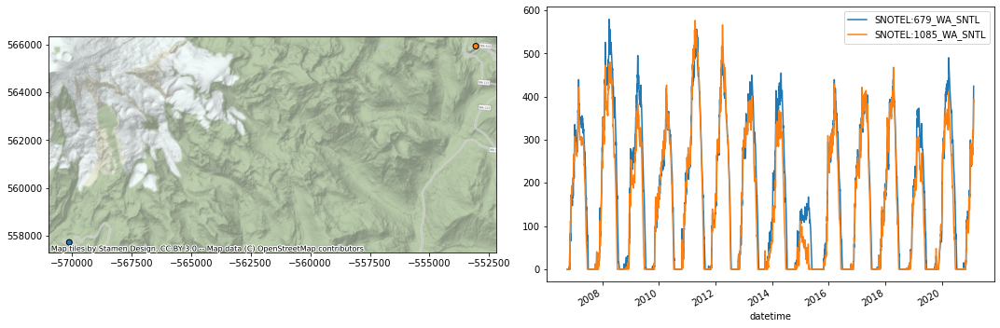

In [78]:
f, axa = plt.subplots(1,2,figsize=(15,5))
sites_gdf_wa.loc[site_list].plot(facecolor=color_list, edgecolor='k', ax=axa[0])
ctx.add_basemap(ax=axa[0], crs=sites_gdf_wa.crs, source=ctx.providers.Stamen.Terrain, alpha=0.7)
snwd_df[site_list].dropna(thresh=2).plot(ax=axa[1])
plt.tight_layout()

### Consider seasonal variability in snow depth evolution for the two sites
* Create a scatterplot showing snow depth from site 1 on the y axis and site 2 on the x axis, with color ramp representing DOWY
* The points should fall on the 1:1 line if the snow depth evolution was identical

In [79]:
#Add column for dowy
add_dowy(snwd_df)

In [80]:
snwd_df[[*site_list,'dowy']].dropna(thresh=2)

,SNOTEL:679_WA_SNTL,SNOTEL:1085_WA_SNTL,dowy
datetime,,,
2006-08-18 00:00:00+00:00,0.00,NaN,322
2006-08-19 00:00:00+00:00,0.00,NaN,323
2006-08-20 00:00:00+00:00,0.00,NaN,324
2006-08-21 00:00:00+00:00,0.00,NaN,325
2006-08-22 00:00:00+00:00,0.00,NaN,326
...,...,...,...
2021-02-13 00:00:00+00:00,360.68,327.66,136
2021-02-14 00:00:00+00:00,370.84,342.90,137
2021-02-15 00:00:00+00:00,383.54,363.22,138


In [81]:
max_snwd = int(np.ceil(snwd_df[[*site_list]].dropna(thresh=2).max().max()))

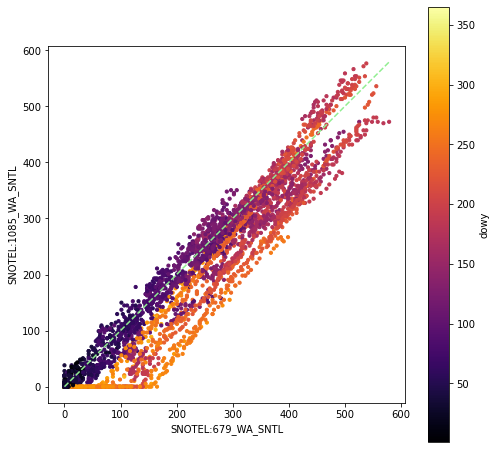

In [82]:
f,ax = plt.subplots(figsize=(8,8))
ax.set_aspect('equal')
snwd_df[[*site_list,'dowy']].dropna(thresh=2).plot.scatter(x=site1,y=site2,c='dowy',cmap='inferno', s=10,ax=ax);
ax.plot(range(0,max_snwd), range(0,max_snwd), color='lightgreen', ls='--');

*Looks like 679 has greater snow depth later in the season, compared to 1085*

## Determine Pearson's correlation coefficient for the two time series
* https://en.wikipedia.org/wiki/Pearson_correlation_coefficient
* See the Pandas `corr` method
    * This should properly handle nan under the hood!

In [83]:
snwd_corr = snwd_df[site_list].corr()
snwd_corr

,SNOTEL:679_WA_SNTL,SNOTEL:1085_WA_SNTL
SNOTEL:679_WA_SNTL,1.000000,0.970401
SNOTEL:1085_WA_SNTL,0.970401,1.000000


*As expected, these two records are highly correlated!*

### Now repeat for several nearby sites

In [84]:
site_list = [site1,site2,site3,site4,site5]
#Use corresponding colors in line and location scatterplots
color_list = ['C%i' % i for i in range(len(site_list))]

In [85]:
mygdf = sites_gdf_wa.loc[site_list]
mygdf

,code,name,network,elevation_m,site_property,geometry
SNOTEL:679_WA_SNTL,679_WA_SNTL,Paradise,SNOTEL,1563.624023,"{'county': 'Pierce', 'state': 'Washington', 's...",POINT (-570102.829 557709.249)
SNOTEL:1085_WA_SNTL,1085_WA_SNTL,Cayuse Pass,SNOTEL,1597.151978,"{'county': 'Pierce', 'state': 'Washington', 's...",POINT (-553060.628 565941.972)
SNOTEL:1257_WA_SNTL,1257_WA_SNTL,Skate Creek,SNOTEL,1149.095947,"{'county': 'Lewis', 'state': 'Washington', 'si...",POINT (-577759.243 542830.006)
SNOTEL:941_WA_SNTL,941_WA_SNTL,Mowich,SNOTEL,963.168030,"{'county': 'Pierce', 'state': 'Washington', 's...",POINT (-584219.828 575219.336)
SNOTEL:642_WA_SNTL,642_WA_SNTL,Morse Lake,SNOTEL,1648.968018,"{'county': 'Yakima', 'state': 'Washington', 's...",POINT (-548802.595 569633.965)


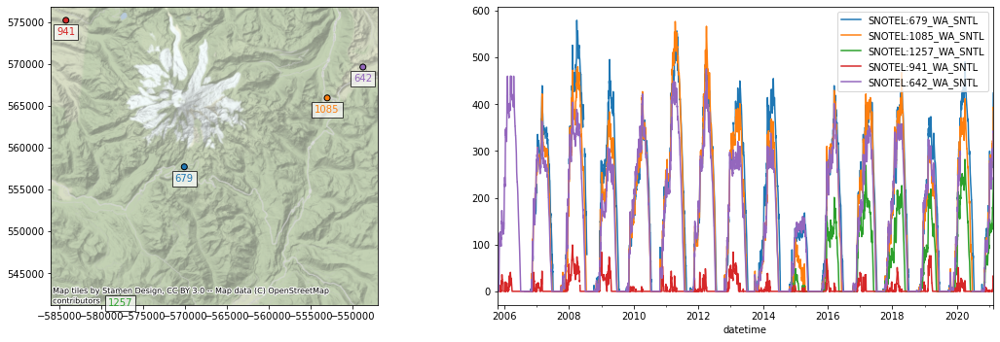

In [86]:
f, axa = plt.subplots(1,2,figsize=(15,5))
mygdf.plot(facecolor=color_list, edgecolor='k', ax=axa[0])
for x, y, label, c in zip(mygdf.geometry.x, mygdf.geometry.y, mygdf.code.str.split('_').str[0], color_list):
    axa[0].annotate(label, xy=(x,y), xytext=(0, -15), ha='center', textcoords="offset points", color=c, bbox=dict(boxstyle="square",fc='w',alpha=0.7))
ctx.add_basemap(ax=axa[0], crs=sites_gdf_wa.crs, source=ctx.providers.Stamen.Terrain, alpha=0.7)
snwd_df[site_list].dropna(thresh=2).plot(ax=axa[1])
plt.tight_layout()

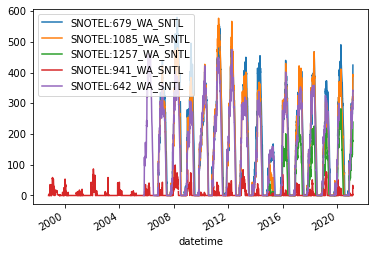

In [87]:
snwd_df[site_list].dropna(how='all').plot();

In [88]:
#The Pandas `corr` should properly handle nans
snwd_corr = snwd_df[site_list].corr()
snwd_corr

,SNOTEL:679_WA_SNTL,SNOTEL:1085_WA_SNTL,SNOTEL:1257_WA_SNTL,SNOTEL:941_WA_SNTL,SNOTEL:642_WA_SNTL
SNOTEL:679_WA_SNTL,1.000000,0.970401,0.903934,0.427085,0.954083
SNOTEL:1085_WA_SNTL,0.970401,1.000000,0.939357,0.418298,0.976739
SNOTEL:1257_WA_SNTL,0.903934,0.939357,1.000000,0.500938,0.905656
SNOTEL:941_WA_SNTL,0.427085,0.418298,0.500938,1.000000,0.404402
SNOTEL:642_WA_SNTL,0.954083,0.976739,0.905656,0.404402,1.000000


### Visualize correlation values for different combinations of stations

In [89]:
#Not sure why 0.5 values are not identical color?
snwd_corr.style.background_gradient(cmap='inferno').set_precision(2)

,SNOTEL:679_WA_SNTL,SNOTEL:1085_WA_SNTL,SNOTEL:1257_WA_SNTL,SNOTEL:941_WA_SNTL,SNOTEL:642_WA_SNTL
SNOTEL:679_WA_SNTL,1.00,0.97,0.90,0.43,0.95
SNOTEL:1085_WA_SNTL,0.97,1.00,0.94,0.42,0.98
SNOTEL:1257_WA_SNTL,0.90,0.94,1.00,0.50,0.91
SNOTEL:941_WA_SNTL,0.43,0.42,0.50,1.00,0.40
SNOTEL:642_WA_SNTL,0.95,0.98,0.91,0.40,1.00


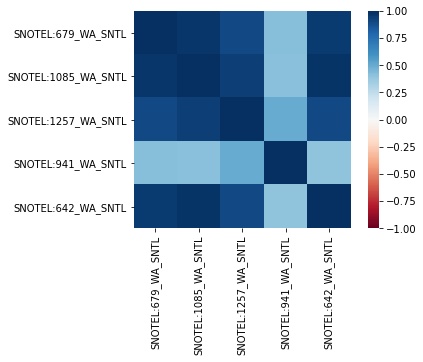

In [90]:
import seaborn as sns
sns.heatmap(snwd_corr, cmap='RdBu', vmin=-1, vmax=1, square=True);

### Extra Credit: Consider spatial variability of these correlation coefficients
* Select a reference station
* Compute correlation scores with this reference station
    * Join the correlation score values with original GeoDataFrame containing Point geometries
* Create a scatter plot (map) of correlation score

In [91]:
ref = site1

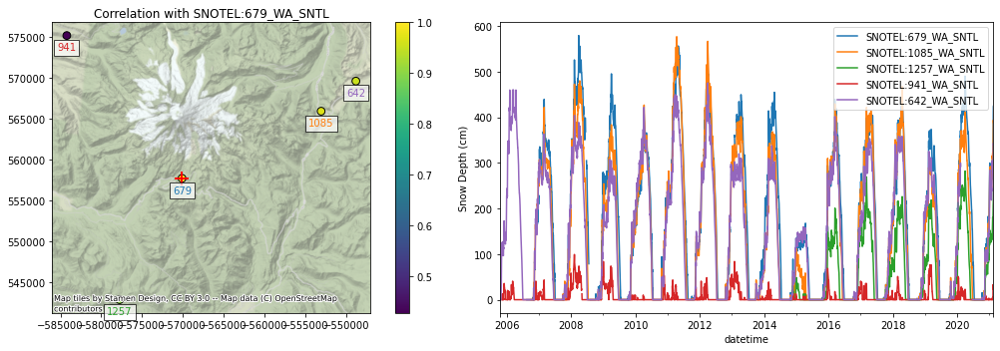

In [92]:
f, axa = plt.subplots(1,2,figsize=(15,5))
#Join the ref site correlation scores with the original geodataframe and plot
mygdf.join(snwd_corr[ref]).plot(ax=axa[0], column=ref, legend=True, markersize=60, edgecolor='k')
#sites_gdf_wa.loc[site_list].join(snwd_corr[ref]).plot(ax=ax, column=ref, legend=True, markersize=100, edgecolor=color_list, lw=2.0)
for x, y, label, c in zip(mygdf.geometry.x, mygdf.geometry.y, mygdf.code.str.split('_').str[0], color_list):
    axa[0].annotate(label, xy=(x,y), xytext=(0, -15), ha='center', textcoords="offset points", color=c, bbox=dict(boxstyle="square",fc='w',alpha=0.7))
#Plot the reference site
sites_gdf_wa.loc[[ref,ref]].plot(ax=axa[0], marker='+', markersize=200, color='r')
ctx.add_basemap(ax=axa[0], crs=sites_gdf_wa.crs, source=ctx.providers.Stamen.Terrain, alpha=0.7)
axa[0].set_title("Correlation with %s" % ref)
snwd_df[site_list].dropna(thresh=2).plot(ax=axa[1]);
axa[1].set_ylabel('Snow Depth (cm)')
plt.tight_layout()

### Extra Credit: Consider the correlation as a function of distance from the reference station
* Compute the distance in km between the reference station and all other stations
* Create a plot of correlation coefficient vs. distance

# Part 5: Extra Credit: Consider correlation for all SNOTEL sites across Western U.S.

* Consider correlation vs. distance
* Consider correlation vs. elevation (relative to ref station elevation)

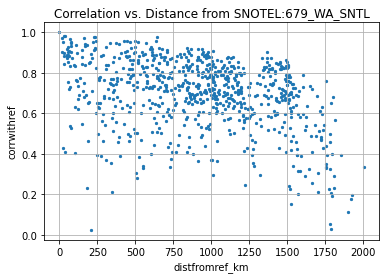

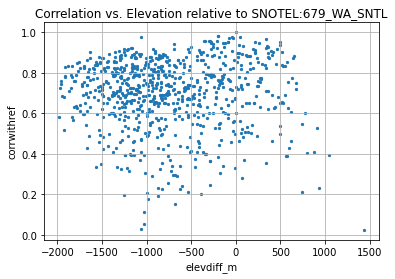

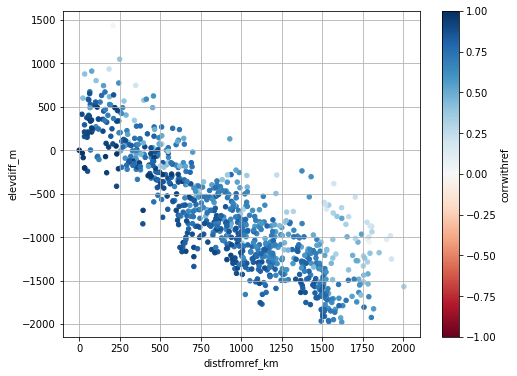

In [102]:
# Scatterplot to consider both distance and elevation

### Create a map to consider spatial variability in correlation

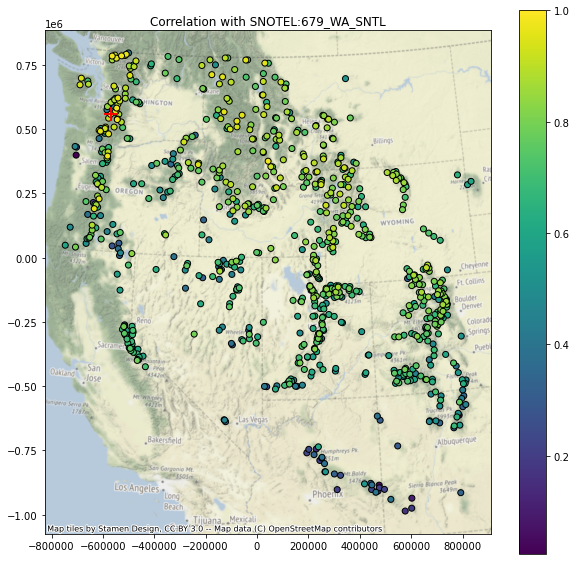

# Part 6: Compute daily snow depth difference for all stations
* This represents daily snow accumulation or ablation
* See the Pandas `diff` function
    * Make sure you specify the axis properly to difference over time (not station to station), and sanity check
    * This should correctly account for missing values, but need to double-check
* Sanity check with `tail` - most values should be relatively small (+/-1-6)

In [106]:
snwd_df_diff.head()

,SNOTEL:301_CA_SNTL,SNOTEL:907_UT_SNTL,SNOTEL:916_MT_SNTL,SNOTEL:908_WA_SNTL,SNOTEL:302_OR_SNTL,SNOTEL:1000_OR_SNTL,SNOTEL:303_CO_SNTL,SNOTEL:1030_CO_SNTL,SNOTEL:304_OR_SNTL,SNOTEL:306_ID_SNTL,...,SNOTEL:874_CO_SNTL,SNOTEL:875_WY_SNTL,SNOTEL:876_MT_SNTL,SNOTEL:877_AZ_SNTL,SNOTEL:1228_UT_SNTL,SNOTEL:1197_UT_SNTL,SNOTEL:878_WY_SNTL,SNOTEL:1033_CO_SNTL,doy,dowy
datetime,,,,,,,,,,,,,,,,,,,,,
1984-10-01 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1984-10-02 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0
1984-10-03 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0
1984-10-04 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0
1984-10-05 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0


## Create plot showing this daily accumulation for all sites
* Can start by trying to plot a subset of sites
    * May take ~1-2 min to plot all ~800 sites
* Adjusting the ylim appropriately
* Probably best to set `legend=False` in your plot call
* Add a black horizontal line at 0 with linewidth=0.5

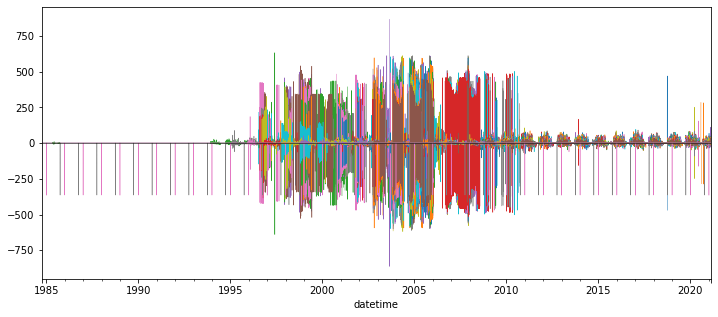

In [107]:
f,ax = plt.subplots(figsize=(12,5))
snwd_df_diff.plot(ax=ax,legend=False, lw=0.5)
ax.axhline(0, color='k', lw=0.5);

## Interpretation (Provide brief written response these questions)
* Do you think you can confidently identify large snow accumulation events using these difference values?
* Are some periods noisier than others?
* When the snow depth increases from one day to the next, what happened?
* When the snow depth decreases from one day to the next, what happened?
    * Hint: during the winter, some days never get above freezing, but snow depths still decrease...

## Extra Credit: Design filters to remove artifacts and outliers
* Could likely design a series of filters to remove outliers from original snow depth value time series and the difference time series for each site
* One idea:
    * What is the maximum amount of snowfall you would expect in a 24-hour period? 
    * How about the maximum decrease in snow depth in a 24-hour period?
* Can also combine multiple stations for another round of filters:
    * If a single station shows an increase of 2 m, but all others show a decrease, is that realistic?
* Other considerations:
    * mean +/- (3 * std) is often used to remove outliers from normally distributed values (but is this the case for your difference values?)
* Maybe come back to this if you have time later, for now, just note the presence of measurement errors

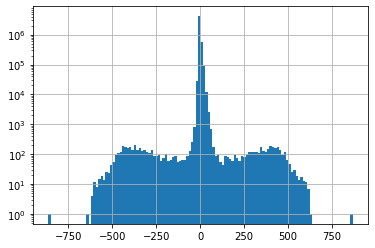

In [108]:
f, ax = plt.subplots()
snwd_df_diff.stack().hist(bins=128, ax=ax, log=True);

In [109]:
snwd_df_diff.count().sum()

4870357

In [110]:
#Mean and std for entire dataset before filtering
print(np.nanmean(snwd_df_diff.values), np.nanstd(snwd_df_diff.values))

0.008573285284836417 14.208349379818223


In [111]:
#Assume maximum daily snowfall of 1.7 m
max_diff = 170
idx = snwd_df_diff > max_diff
#Assume minimum daily decrease of 0.7 m
min_diff = -70
idx = idx | (snwd_df_diff < min_diff)
snwd_df_diff[idx] = np.nan

In [112]:
snwd_df_diff.count().sum()

4863720

In [113]:
f=3
#Mean and std for entire dataset
print(np.nanmean(snwd_df_diff.values), np.nanstd(snwd_df_diff.values))

0.02167078696964463 5.002396854299748


In [114]:
snwd_df_diff.mean().mean()

0.02183840322357014

In [115]:
snwd_df_diff.std().mean()

4.660904228013316

In [116]:
#Mean and std for each site
#idx = (snwd_df_diff - snwd_df_diff.mean()).abs().gt(f*snwd_df_diff.std())
#snwd_df_diff[idx] = np.nan

In [117]:
#Mean and std for each day
#idx = (snwd_df_diff.sub(snwd_df_diff.mean(axis=1), axis=0)).abs().gt(f*snwd_df_diff.std(axis=1))
#snwd_df_diff[idx] = np.nan

In [118]:
snwd_df_diff.median(axis=1).max()

/srv/conda/envs/notebook/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:993: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanmedian1d, axis, a, overwrite_input)


15.240000000000009

In [119]:
snwd_df_diff.count().sum()

4863720

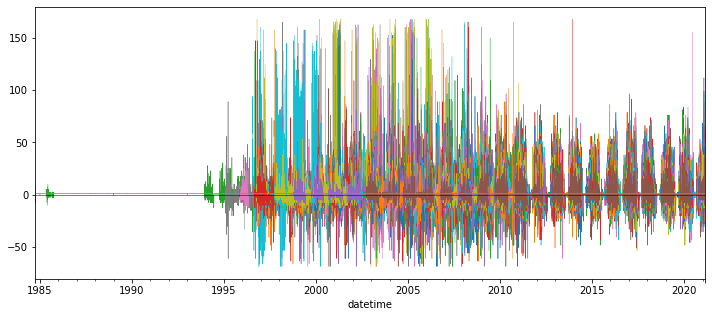

In [120]:
f,ax = plt.subplots(figsize=(12,5))
snwd_df_diff.plot(ax=ax,legend=False, lw=0.5)
ax.axhline(0, color='k', lw=0.5);

## For now, let's aggregate across all stations using robust statistics
* Create a plot showing the median difference values across all stations for each day in the record (not doy, but all days with data)
    * Again, careful about which axis along which you're computing the median
* You may need to adjust the ylim to bring out detail if you haven't removed outliers

/srv/conda/envs/notebook/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:993: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanmedian1d, axis, a, overwrite_input)


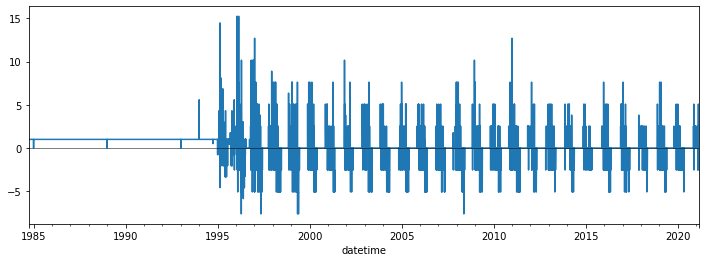

## Create a similar plot, but limit to records since Jan 1 of current year
* Can you identify any big snow events?  
* I added shading to show spread of values (+/-nmad), but this is optional

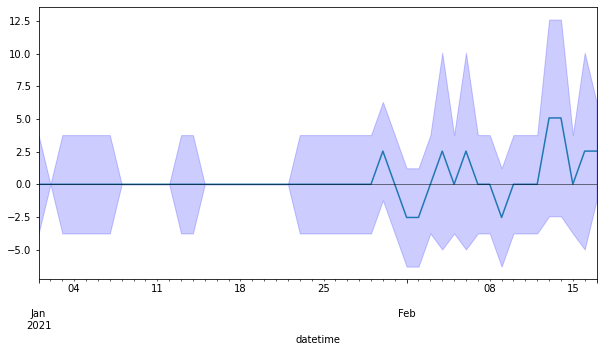

## Now plot just the WA stations (use the `wa_stations` index we already calculated)
* Can do this with `snwd_df_diff.loc[:,wa_stations]`
    * Note: some stations we identified earlier may be missing from the larger time series data frame!
    * Can remove those as shown below
* What date had the greatest daily snow accumulation across all stations in WA?

In [124]:
print(wa_stations.shape)
wa_stations = wa_stations[wa_stations.isin(snwd_df_diff.columns)]
print(wa_stations.shape)

(84,)
(75,)


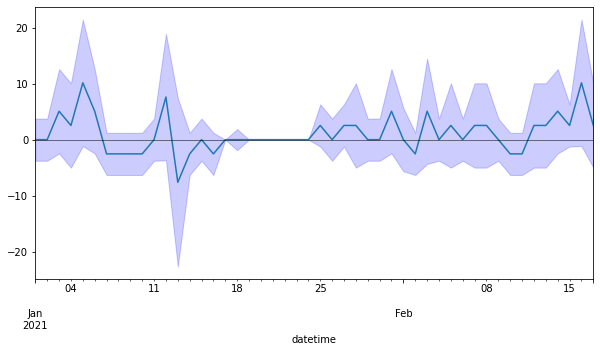

## Extra Credit: Repeat for WA high elevation sites (defined earlier)

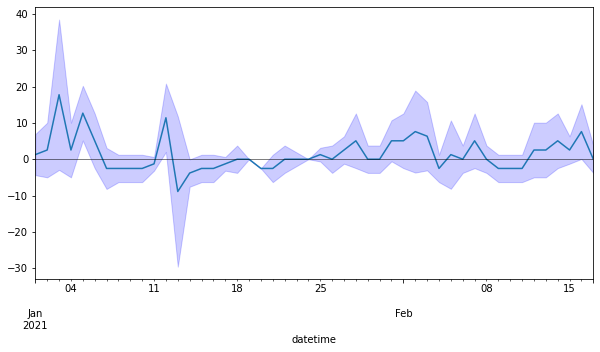

# Part 7: Compute statistics for all time series at all SNOTEL sites and evaluate spatial variability
* So, now we're going back to our GeoDataFrame containing Point geometry for all sites, and adding some key metrics

In [131]:
col_list = []

## Get the count of valid daily records (not NaN) available for each station
* Which station has the greatest number of observations for SNWD_D?

In [132]:
snwd_df.count(axis=0).sort_values().tail()

SNOTEL:570_NV_SNTL     8982
SNOTEL:651_OR_SNTL     9007
SNOTEL:347_MT_SNTL     9928
doy                   13289
dowy                  13289
dtype: int64

## Add the count of valid time series records for each station a new column in our original WA sites GeoDataframe (the one containing lat/lon and other site attributes)
* Should be straightforward, let Pandas do the work to match site index values
* Verify your site DataFrame now has a count column

In [133]:
col = 'Total Observation Count (days)'
gdf[col] = snwd_df.count(axis=0)
col_list.append(col)
gdf.head()

,code,name,network,elevation_m,site_property,geometry,Total Observation Count (days)
SNOTEL:301_CA_SNTL,301_CA_SNTL,Adin Mtn,SNOTEL,1886.712036,"{'county': 'Modoc', 'state': 'California', 'si...",POINT (-120.79192 41.23583),8237.0
SNOTEL:907_UT_SNTL,907_UT_SNTL,Agua Canyon,SNOTEL,2712.719971,"{'county': 'Kane', 'state': 'Utah', 'site_comm...",POINT (-112.27118 37.52217),8173.0
SNOTEL:916_MT_SNTL,916_MT_SNTL,Albro Lake,SNOTEL,2529.840088,"{'county': 'Madison', 'state': 'Montana', 'sit...",POINT (-111.95902 45.59723),8924.0
SNOTEL:908_WA_SNTL,908_WA_SNTL,Alpine Meadows,SNOTEL,1066.800049,"{'county': 'King', 'state': 'Washington', 'sit...",POINT (-121.69847 47.77957),6103.0
SNOTEL:302_OR_SNTL,302_OR_SNTL,Aneroid Lake #2,SNOTEL,2255.520020,"{'county': 'Wallowa', 'state': 'Oregon', 'site...",POINT (-117.19258 45.21328),7407.0


## Add a column for the long-term max snow depth on record for each site
* Might need to be careful about measurement errors here - maybe look at values and filter obvious outliers
* Could also consider a threshold for minimum count of valid days

## Add a column for the daily difference (snow accumulation) at all sites for Feb 13, 2021 (or other recent storm)
* Note, Pandas uses a `Timestamp` object that wraps the commond Python `datetime` objects
* pd.Timestamp('YYYY-MM-DD')
* Note, you may need to use `mydataframe.loc[pd.Timestamp('YYYY-MM-DD')]`

## Add a column for the snow depth for a recent day (say, yesterday) in the time series
* Use a relative index value here to get the latest Timestamp (like -1, or maybe -2)
    * Note that using timestamp for today could have limited returns, as latest data from some stations have not been integrated into database
* Note that the index is not a string, it is a Pandas Timestamp object: `pd.Timestamp('2019-02-06 00:00:00')`

## Compute the long-term median snow depth for this same doy at all sites
* See earlier example, where we grouped by `df.index.dayofyear`, then aggregated

In [138]:
daily_med

,SNOTEL:301_CA_SNTL,SNOTEL:907_UT_SNTL,SNOTEL:916_MT_SNTL,SNOTEL:908_WA_SNTL,SNOTEL:302_OR_SNTL,SNOTEL:1000_OR_SNTL,SNOTEL:303_CO_SNTL,SNOTEL:1030_CO_SNTL,SNOTEL:304_OR_SNTL,SNOTEL:306_ID_SNTL,...,SNOTEL:874_CO_SNTL,SNOTEL:875_WY_SNTL,SNOTEL:876_MT_SNTL,SNOTEL:877_AZ_SNTL,SNOTEL:1228_UT_SNTL,SNOTEL:1197_UT_SNTL,SNOTEL:878_WY_SNTL,SNOTEL:1033_CO_SNTL,doy,dowy
datetime,,,,,,,,,,,,,,,,,,,,,
1,53.34,35.56,83.82,104.14,86.36,137.16,29.21,101.60,83.82,132.08,...,121.92,49.53,35.56,30.48,58.42,53.34,64.77,99.06,1,93
2,50.80,35.56,83.82,101.60,88.90,137.16,27.94,93.98,82.55,129.54,...,127.00,52.07,35.56,29.21,58.42,48.26,66.04,101.60,2,94
3,53.34,35.56,81.28,101.60,85.09,137.16,27.94,105.41,78.74,128.27,...,124.46,49.53,35.56,27.94,55.88,48.26,71.12,101.60,3,95
4,50.80,35.56,83.82,99.06,85.09,139.70,27.94,104.14,82.55,130.81,...,119.38,55.88,40.64,25.40,58.42,48.26,69.85,106.68,4,96
5,58.42,40.64,83.82,101.60,86.36,154.94,30.48,104.14,81.28,135.89,...,127.00,54.61,38.10,27.94,55.88,45.72,72.39,107.95,5,97
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
362,45.72,35.56,83.82,96.52,81.28,127.00,25.40,101.60,72.39,119.38,...,118.11,44.45,33.02,17.78,60.96,50.80,57.15,96.52,362,89
363,45.72,33.02,81.28,93.98,90.17,142.24,26.67,101.60,72.39,129.54,...,116.84,44.45,33.02,20.32,58.42,55.88,57.15,97.79,363,90
364,48.26,33.02,83.82,96.52,88.90,142.24,25.40,100.33,77.47,132.08,...,127.00,45.72,35.56,19.05,58.42,50.80,62.23,99.06,364,91


## Add a column for the percent of "normal" snow depth for most recent day
* Use the long-term daily median, as we did for a single site earlier

SNOTEL:301_CA_SNTL     109.375000
SNOTEL:907_UT_SNTL      68.181818
SNOTEL:916_MT_SNTL      97.674419
SNOTEL:908_WA_SNTL     131.081081
SNOTEL:302_OR_SNTL            NaN
                          ...    
SNOTEL:877_AZ_SNTL      42.105263
SNOTEL:1228_UT_SNTL    127.586207
SNOTEL:1197_UT_SNTL     92.000000
SNOTEL:878_WY_SNTL     103.529412
SNOTEL:1033_CO_SNTL     88.275862
Name: 2021-02-16 Percent of Normal Snow Depth, Length: 865, dtype: float64

## Add a column for _total_ snow accumulation in February of the current year
* Use a `slice` object of pandas Timestamps
* You'll want to isolate and include the days with positive snow accumulation (excluding days where no new snow fell)
    * Can then compute a sum!

## Add a column for the long-term mean snow depth at each site
* Note: to do this properly, probably want to remove any values near 0 (no snow on the ground) before computing the mean
    * Maybe a threshold of 1 cm?

## Sanity check on columns and values
* You may have slightly different column names and values here, as these stats were computed for an earlier query of original SNOTEL data

In [172]:
gdf.head()

,code,name,network,elevation_m,site_property,geometry,Total Observation Count (days),Long-term Max Snow Depth (cm),2021-02-13 Accumulation (cm),2021-02-16 00:00:00+00:00,2021-02-16 Percent of Normal Snow Depth,Feb 2021 Total Accumulation (cm),Long-term Mean Snow Depth (cm)
SNOTEL:301_CA_SNTL,301_CA_SNTL,Adin Mtn,SNOTEL,1886.712036,"{'county': 'Modoc', 'state': 'California', 'si...",POINT (-120.79192 41.23583),8237.0,167.64,7.62,88.90,109.375000,30.48,53.379241
SNOTEL:907_UT_SNTL,907_UT_SNTL,Agua Canyon,SNOTEL,2712.719971,"{'county': 'Kane', 'state': 'Utah', 'site_comm...",POINT (-112.27118 37.52217),8173.0,177.80,2.54,38.10,68.181818,17.78,47.404758
SNOTEL:916_MT_SNTL,916_MT_SNTL,Albro Lake,SNOTEL,2529.840088,"{'county': 'Madison', 'state': 'Montana', 'sit...",POINT (-111.95902 45.59723),8924.0,241.30,5.08,106.68,97.674419,33.02,91.960994
SNOTEL:908_WA_SNTL,908_WA_SNTL,Alpine Meadows,SNOTEL,1066.800049,"{'county': 'King', 'state': 'Washington', 'sit...",POINT (-121.69847 47.77957),6103.0,444.50,0.00,246.38,131.081081,127.00,150.637508
SNOTEL:302_OR_SNTL,302_OR_SNTL,Aneroid Lake #2,SNOTEL,2255.520020,"{'county': 'Wallowa', 'state': 'Oregon', 'site...",POINT (-117.19258 45.21328),7407.0,271.78,NaN,NaN,NaN,0.00,102.905574


# Create some scatterplots to review these metrics
* Hint: remove NaN records on the fly before plotting - see the `dropna()` method
    * Best to apply after isolating the column you want to plot, consider `mydataframe[['max', 'geometry]].dropna().plot(column='max', ...)`
* Can plot separately, or create a figure with multiple subplots, and add titles/labels appropriately
* I create a function to create the plot, and then looped over each column name I wanted to plot

/srv/conda/envs/notebook/lib/python3.8/site-packages/matplotlib/colors.py:1062: RuntimeWarning: invalid value encountered in true_divide
  resdat /= (vmax - vmin)


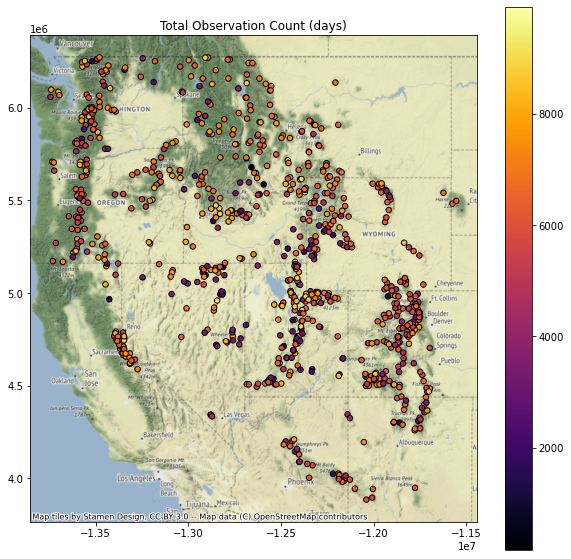

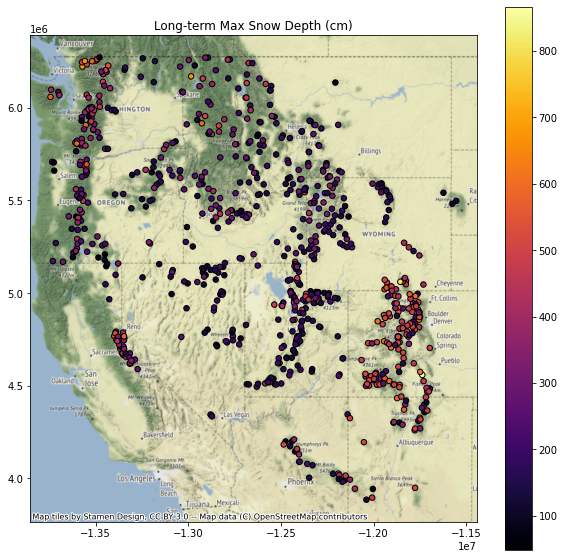

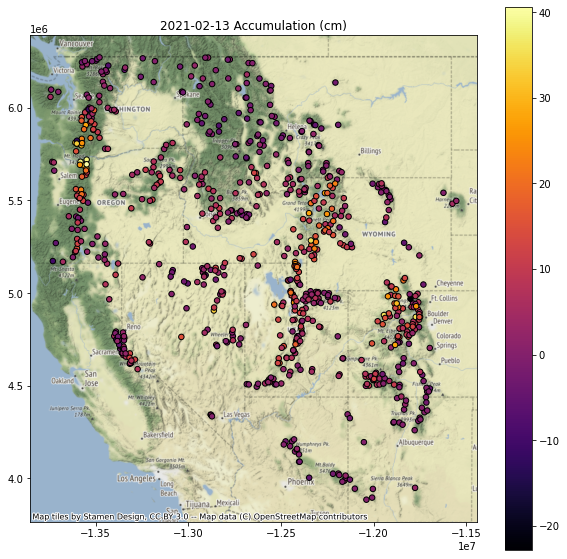

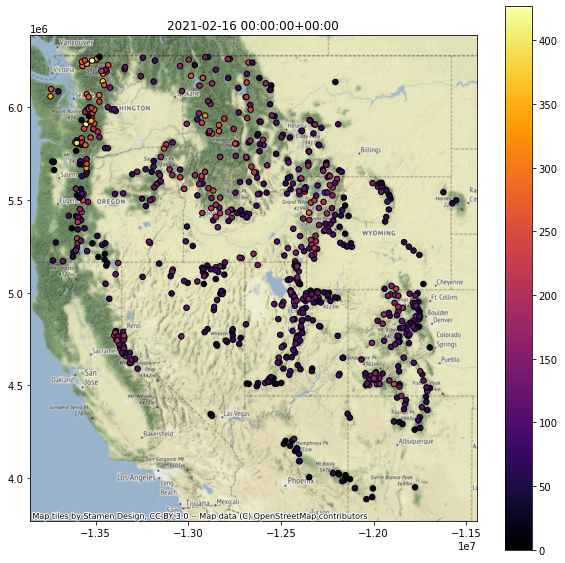

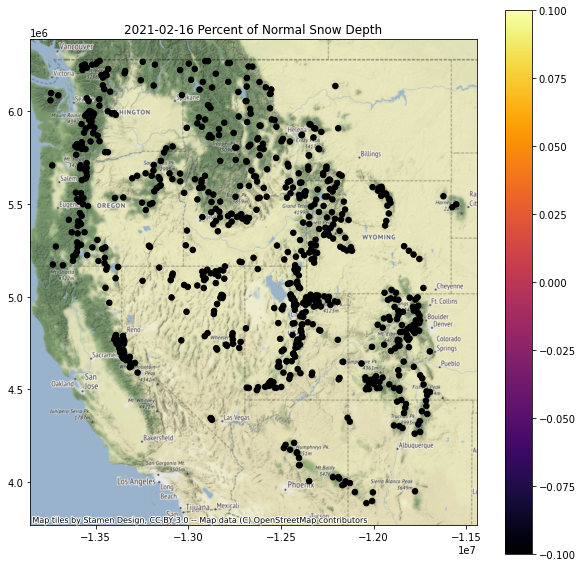

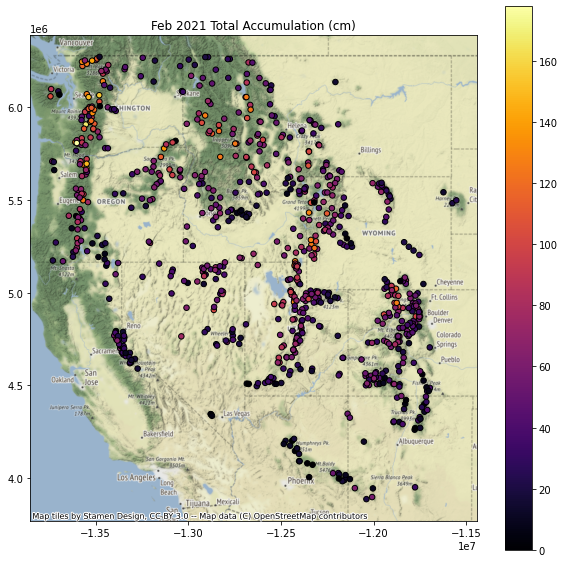

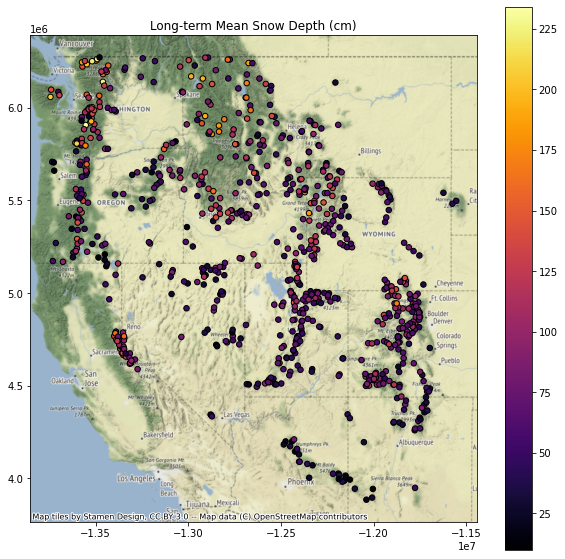

In [144]:
for col in col_list:
    f, ax = plt.subplots(figsize=(10,10))
    ax.set_title(col)
    gdf[[col, 'geometry']].to_crs('EPSG:3857').dropna().plot(ax=ax, column=col, markersize=30, edgecolor='k', cmap='inferno', legend=True)
    ctx.add_basemap(ax=ax, source=ctx.providers.Stamen.Terrain)

## Replot percent of normal (descending sort)
* Plotting order can be important when you have larger markers that overlap - you can end up with very different interpretations depending on values displayed on top of the plot
* Let's explorer this by reviewing the "percent of normal snow depth" plot with ascending and descending order
* This should be pretty straightforward to sort and plot
    * `gdf.to_crs('EPSG:3857')[[col, 'geometry']].dropna().sort_values(by=col, ascending=False).plot()`
    * Need to set the column name appropriately

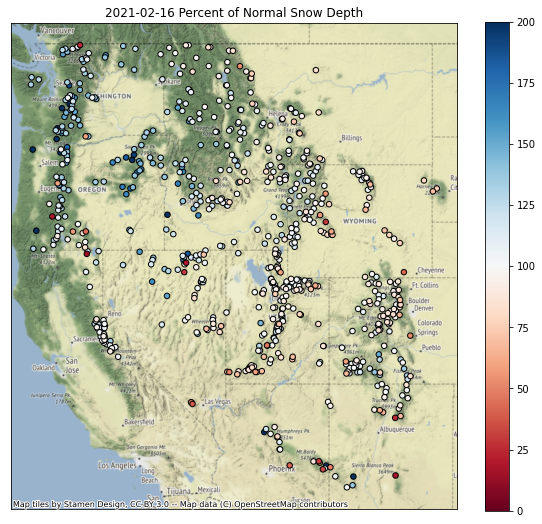

## Replot percent of normal (ascending sort)

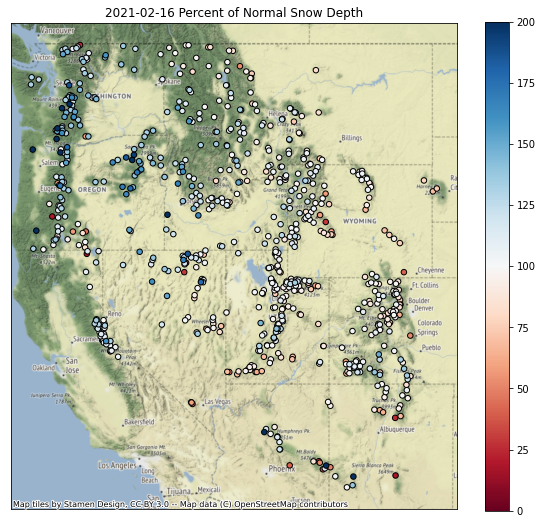

*Interpretation: plotting order can be important, leading to different interpreations! For example, compare values over the Sierra Nevada in CA in the above two plots.*

## Extra Credit: Can you identify the SNOTEL site with:
* Greatest long-term maximum snow depth
    * *Is this necessarily the true maximum?*
    * *What happens if the snow gets higher than the instrument?*
* Greatest accumulation in February of current year
    * Where should I go skiing this weekend if I like deep snow?

## Extra Credit: Repeat the above plotting for the WA state extent

## Extra Credit: Limit your analysis to only include stations with >15 years of data

# Part 8: Interpolating sparse values
* Let's create continuous gridded values (AKA Raster!) from our sparse point data
* Note that we wouldn't do this in practice, as there are much more sophisticated approaches one should use here, but let's use this dataset to explore some basic interpolation approaches
* We'll use the `scipy.interpolate.griddata` function here, using 'nearest' to start, and `scipy.interpolate.Rbf`

## Interpolate February accumulation pattern

In [152]:
import numpy as np
import scipy.interpolate

## Specify the column name of variable to interpolate

In [153]:
#Most recent day
col = ts

In [154]:
#February
col= f'Feb {curr_y} Total Accumulation (cm)'

## Review the comments/code in the following cells, then run

In [155]:
#Extract the column and geometry, drop NaNs
gdf_dropna = gdf.to_crs(aea_proj)[[col,'geometry']].dropna()
#Pull out (x,y,val)
x = gdf_dropna.geometry.x
y = gdf_dropna.geometry.y
z = gdf_dropna[col]
#Get min and max values
zlim = (z.min(), z.max())

In [156]:
#Compute the spatial extent of the points - we will interpolate across this domain
bounds = gdf_dropna.total_bounds

In [157]:
#Spatial interpolation step of 1 km
dx,dy = (10000,10000)

In [158]:
#Limit to WA state
#bounds = wa_state.total_bounds
#dx,dy = (1000,1000)

In [159]:
#Create 1D arrays of grid cell coordinates in the x and y directions
xi = np.arange(np.floor(bounds[0]), np.ceil(bounds[2]),dx)
yi = np.arange(np.floor(bounds[1]), np.ceil(bounds[3]),dy)

In [160]:
#Function that will plot the interpolated grid, overlaying original values
def plotinterp(zi):
    f, ax = plt.subplots(figsize=(10,10))
    #Define extent of the interpolated grid in projected coordinate system, using matplotlib extent format (left, right, bottom, top)
    mpl_extent = [bounds[0], bounds[2], bounds[1], bounds[3]]
    #Plot the interpolated grid, providing known extent
    #Note: need the [::-1] to flip the grid in the y direction
    ax.imshow(zi[::-1,], cmap='inferno', extent=mpl_extent, clim=zlim)
    #Overlay the original point values with the same color ramp
    gdf_dropna.plot(ax=ax, column=col, cmap='inferno', markersize=30, edgecolor='0.5', vmin=zlim[0], vmax=zlim[1], legend=True)
    #Overlay WA polygon
    #wa_state.plot(ax=ax, facecolor='none', edgecolor='white')
    ax.autoscale(False)
    states_gdf_proj.plot(ax=ax, facecolor='none', edgecolor='white')
    #Make sure aspect is equal
    ax.set_aspect('equal')

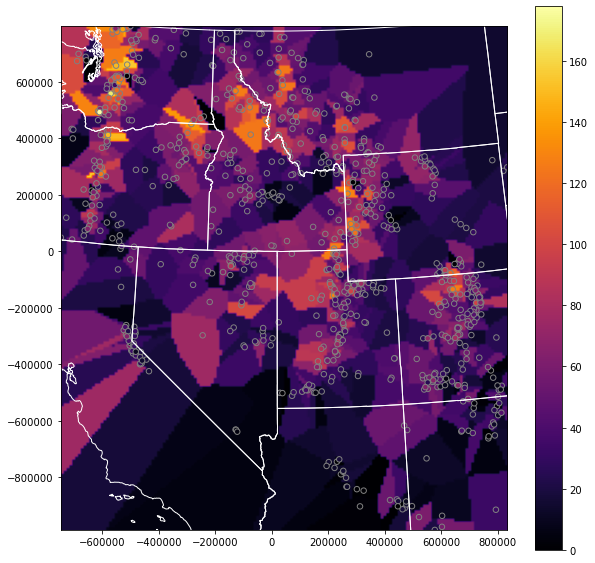

In [161]:
#Create 2D grids from the xi and yi grid cell coordinates
xx, yy = np.meshgrid(xi, yi)
#Interpolate values using griddata
zi = scipy.interpolate.griddata((x,y), z, (xx, yy), method='nearest')
plotinterp(zi)

## Radial basis function interpolation
* https://en.wikipedia.org/wiki/Radial_basis_function_interpolation

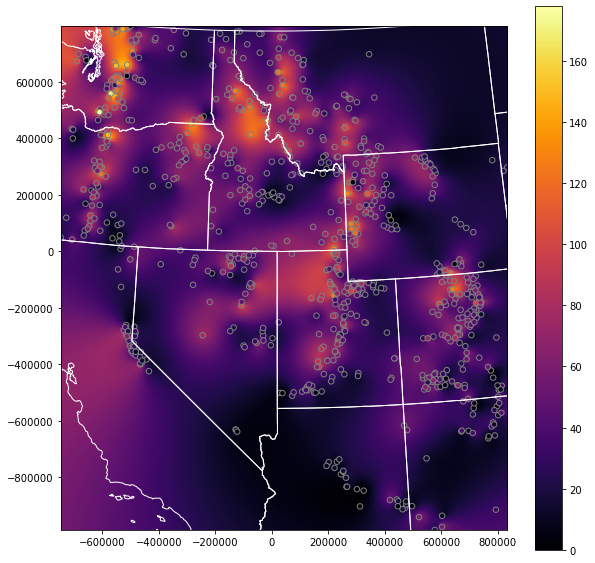

In [162]:
#Use Radial basis function interpolation
f = scipy.interpolate.Rbf(x,y,z, function='linear')
zi = f(xx, yy)
plotinterp(zi)

### Explore this a bit
* Try a few different interpolation methods for griddata and Rbf
    * https://docs.scipy.org/doc/scipy/reference/generated/scipy.interpolate.griddata.html#scipy.interpolate.griddata
    * https://docs.scipy.org/doc/scipy/reference/generated/scipy.interpolate.Rbf.html#scipy.interpolate.Rbf
* Extra Credit: Play around with some other unstructured data interpolation methods
    * https://docs.scipy.org/doc/scipy/reference/interpolate.html#multivariate-interpolation
    * Others outside of scipy.interpolate

### Write out the interpolated snow depth grid using rasterio (raster review)

In [163]:
#Grid origin (center of pixel?)
origin = (xi.min(), yi.min())
print(origin)
#Grid cell size
print(dx, dy)

(-746621.0, -986535.0)
10000 10000


In [164]:
#https://gis.stackexchange.com/questions/279953/numpy-array-to-gtiff-using-rasterio-without-source-raster
import rasterio as rio

transform = rio.transform.from_origin(xi.min(), yi.max(), dx, dy)

out_fn = 'snotel_interp_test.tif'
new_dataset = rio.open(out_fn, 'w', driver='GTiff',
                            height = zi.shape[0], width = zi.shape[1],
                            count=1, dtype=str(zi.dtype),
                            crs=gdf.crs,
                            transform=transform)

new_dataset.write(zi[::-1,], 1)
new_dataset.close()

In [165]:
!ls -l $out_fn

-rw-r--r-- 1 jovyan users 226802 Feb 26 23:09 snotel_interp_test.tif


### Load from disk to verify

{'driver': 'GTiff', 'dtype': 'float64', 'nodata': None, 'width': 158, 'height': 179, 'count': 1, 'crs': CRS.from_epsg(4326), 'transform': Affine(10000.0, 0.0, -746621.0,
       0.0, -10000.0, 793465.0), 'tiled': False, 'interleave': 'band'}


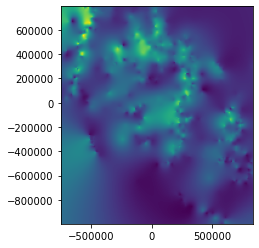

In [166]:
from rasterio.plot import show
with rio.open(out_fn) as src:
    print(src.profile)
    show(src)

## Extra Credit: Explore Kriging

https://scikit-learn.org/stable/modules/gaussian_process.html

## Extra Credit: Clip interpolated grid to buffered radius around all stations
* Clip the interpolated rasters within 20 km of stations

## Extra Credit: Limit interpolation or clip to:
* Mountain ecoregion: https://www.epa.gov/eco-research/level-iii-and-iv-ecoregions-continental-united-states
* Mountain classes: https://rmgsc.cr.usgs.gov/gme/
* Observed recent snowcover mask derived from MODIS data for the corresponding date
    * See great resource **Snow Today** at the National Snow and Ice Data Center: https://nsidc.org/snow-today

## Extra Credit: Consider spatial autocorrelation for the network
Some samples:
* http://darribas.org/gds15/content/labs/lab_06.html  
* http://darribas.org/gds_scipy16/ipynb_md/04_esda.html

## Extra Credit: Snow depth vs. elevation analysis for WA
* Let's look at snow depth across WA on the most recent day in the record
* Create a quick scatterplot of elevation vs. snow depth for all sites on this day
* Do you see a relationship?  

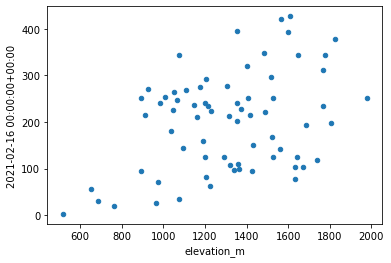

### Try elevation vs. long-term mean

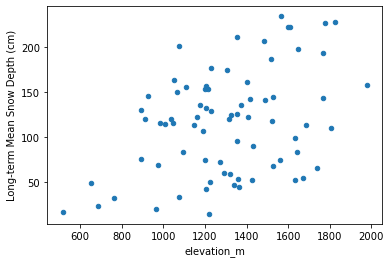

## Extra Credit: Linear regression of snow depth vs. elevation
* Several convenient options in Python.  Here are a few:
    * https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.linregress.html 
    * https://www.statsmodels.org/dev/examples/notebooks/generated/ols.html
* How good is your fit?
* Compare accumulation vs elevation for a recent storm event with abundant lowland snow (e.g., Feb 11) with another more typical accumulation event (where low elevations receive rain and mountains receive snow)

r-squared: 0.15029887693052862


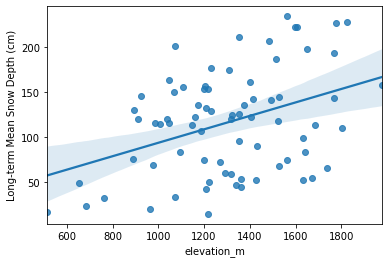

<class 'statsmodels.iolib.summary.Summary'>
"""
                                  OLS Regression Results                                  
==========================================================================================
Dep. Variable:     Long-term Mean Snow Depth (cm)   R-squared:                       0.150
Model:                                        OLS   Adj. R-squared:                  0.139
Method:                             Least Squares   F-statistic:                     12.91
Date:                            Fri, 26 Feb 2021   Prob (F-statistic):           0.000589
Time:                                    23:09:15   Log-Likelihood:                -403.71
No. Observations:                              75   AIC:                             811.4
Df Residuals:                                  73   BIC:                             816.1
Df Model:                                       1                                         
Covariance Type:                        nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const          18.9296     27.839      0.680      0.499     -36.554      74.413
elevation_m     0.0747      0.021      3.593      0.001       0.033       0.116
==============================================================================
Omnibus:                       12.589   Durbin-Watson:                   1.909
Prob(Omnibus):                  0.002   Jarque-Bera (JB):                3.580
Skew:                           0.022   Prob(JB):                        0.167
Kurtosis:                       1.931   Cond. No.                     6.04e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.04e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

## Extra Credit: Consider other variables that could affect snow depth
* Distance from the coast (remember the Lab06 exercise calculating distance from WA perimiter?)
* Mean winter daily temperature (from PRISM)

## Extra credit (or, some additional items to explore)

If you have some time (or curiosity), feel free to explore some of these, or define your own questions.  This is a really rich dataset, and those of you interested in snow or hydrology may have some cool ideas.

1. Compute snow depth statistics across all sites grouping by Water Year (or by month/day range where snow is typically present)
1. Identify date of first major snow accumulation event each year, date of max snow depth, date of snow disappearance - any evolution over time?
1. Split sites into elevation bands and analyze various metrics
1. Perform watershed-scale analysis
1. Explore other interpolation methods for sparse data
1. Create an animated map of daily accumulation in WA for the past two weeks
1. Look at other variables for the SNOTEL sites (e.g., snow water equivalent, temperature data)
    * Note that WTEQ_D time series begin much earlier than SNWD_D
1. Create maps of snow density for WA using WTEQ_D and SNWD_D